In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
import missingno as msno

import datetime
from pandas.tseries.offsets import DateOffset
from pandas.tseries.offsets import MonthEnd

import statsmodels.api as sm
from scipy import stats
import itertools

import gc
import warnings
warnings.filterwarnings("ignore")

plt.style.use("fivethirtyeight")

In [3]:
# pip install chart-studio

In [4]:
# pip install pystan==2.19.1.1 

In [5]:
# pip install prophet

In [6]:
# pip install pmdarima

In [7]:
from itertools import cycle
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
import chart_studio.plotly as py
from plotly.offline import init_notebook_mode, iplot

In [8]:
df = pd.read_csv("coin_Ethereum.csv")

In [9]:
df.head(5)

,SNo,Name,Symbol,Date,High,Low,Open,Close,Volume,Marketcap
0,1,Ethereum,ETH,2015-08-08 23:59:59,2.798810,0.714725,2.793760,0.753325,674188.0,4.548689e+07
1,2,Ethereum,ETH,2015-08-09 23:59:59,0.879810,0.629191,0.706136,0.701897,532170.0,4.239957e+07
2,3,Ethereum,ETH,2015-08-10 23:59:59,0.729854,0.636546,0.713989,0.708448,405283.0,4.281836e+07
3,4,Ethereum,ETH,2015-08-11 23:59:59,1.131410,0.663235,0.708087,1.067860,1463100.0,6.456929e+07
4,5,Ethereum,ETH,2015-08-12 23:59:59,1.289940,0.883608,1.058750,1.217440,2150620.0,7.364501e+07


In [10]:
df.drop(['SNo', 'Name', 'Symbol'], axis=1, inplace=True)

In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2160 entries, 0 to 2159
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Date       2160 non-null   object 
 1   High       2160 non-null   float64
 2   Low        2160 non-null   float64
 3   Open       2160 non-null   float64
 4   Close      2160 non-null   float64
 5   Volume     2160 non-null   float64
 6   Marketcap  2160 non-null   float64
dtypes: float64(6), object(1)
memory usage: 118.2+ KB


In [12]:
df.describe()

,High,Low,Open,Close,Volume,Marketcap
count,2160.000000,2160.000000,2160.000000,2160.000000,2.160000e+03,2.160000e+03
mean,398.258568,365.592589,382.879899,383.910691,7.057058e+09,4.172084e+10
std,628.082281,566.611523,599.719862,601.078766,1.064526e+10,6.909184e+10
min,0.482988,0.420897,0.431589,0.434829,1.021280e+05,3.221363e+07
25%,14.265225,13.190950,13.757600,13.819200,3.825102e+07,1.135576e+09
50%,205.124631,193.302715,198.425096,198.643691,2.148880e+09,2.070063e+10
75%,396.494561,375.146804,386.264935,386.435272,9.629136e+09,4.231010e+10
max,4362.350542,3785.848603,4174.635873,4168.701049,8.448291e+10,4.828819e+11


In [13]:
# Printing the start date and End date of the dataset

sd=df.iloc[0][0]
ed=df.iloc[-1][0]


print('Starting Date',sd)
print('Ending Date',ed)

Starting Date 2015-08-08 23:59:59
Ending Date 2021-07-06 23:59:59


In [14]:
df['Date'] = pd.to_datetime(df['Date'], format='%Y-%m-%d')

# Correlation Plot

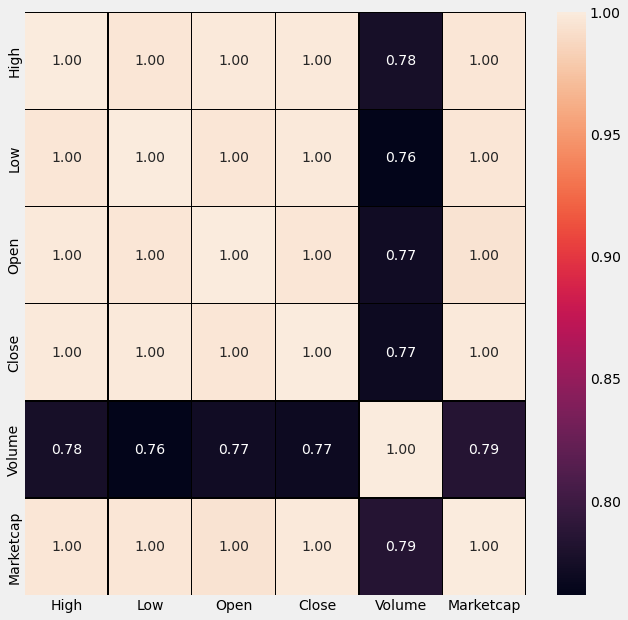

In [11]:
f,ax = plt.subplots(figsize=(10, 10))
sns.heatmap(df.corr(), annot=True, linewidths=0.5, linecolor="black", fmt= '.2f',ax=ax)
plt.show()

# Scatterplot

In [15]:
# import figure factory
import plotly.figure_factory as ff

data_matrix = df.loc[:,['High', 'Low', 'Open', 'Close']]
data_matrix["index"] = np.arange(1,len(data_matrix)+1)
# scatter matrix
fig = ff.create_scatterplotmatrix(data_matrix, diag='histogram', index='index',colormap='rgb(170, 60, 115)',
                                  colormap_type='cat',
                                  height=700, width=700)
iplot(fig)

# Overall Analysis

In [16]:
yearwise= df.groupby(df['Date'].dt.year)[['Open','Close']].mean()
new_order = [2015, 2016, 2017, 2018, 2019, 2020, 2021]
yearwise = yearwise.reindex(new_order, axis=0)
yearwise

,Open,Close
Date,,
2015,0.943310,0.930201
2016,9.763721,9.778040
2017,221.935485,223.915208
2018,485.397384,483.507726
2019,181.771947,181.770138
2020,305.899434,307.542978
2021,2068.592976,2077.092620


In [17]:
names = cycle(['Stock Open Price','Stock Close Price','Stock High Price','Stock Low Price'])

fig = px.line(df, x=df['Date'], y=[df['Open'], df['Close'], 
                                          df['High'], df['Low']],
             labels={'Date': 'Date','value':'Stock Value'})

fig.update_layout(title_text='Stock analysis chart', font_size=15, font_color='black',legend_title_text='Stock Parameters')
fig.for_each_trace(lambda t:  t.update(name = next(names)))
fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)

fig.update_xaxes (rangeslider_visible=True)

fig.show()

In [18]:
names = cycle(['Stock Volume'])

fig = px.line(df, x=df['Date'], y=df['Volume'],
             labels={'Date': 'Date','value':'Stock Volume'})

fig.update_layout(title_text='Stock analysis chart', font_size=15, font_color='black',legend_title_text='Stock Parameters')
fig.for_each_trace(lambda t:  t.update(name = next(names)))

fig.update_xaxes (rangeslider_visible=True)

fig.show()

In [19]:
names = cycle(['Stock Marketcap'])

fig = px.line(df, x=df['Date'], y=df['Marketcap'],
             labels={'Date': 'Date','value':'Stock Market cap'})

fig.update_layout(title_text='Stock analysis chart', font_size=15, font_color='black',legend_title_text='Stock Parameters')
fig.for_each_trace(lambda t:  t.update(name = next(names)))

fig.update_xaxes (rangeslider_visible=True)

fig.show()

In [20]:
fig = go.Figure()

fig.add_trace(go.Bar(
    x=yearwise.index,
    y=yearwise['Open'],
    name='Stock Open Price',
    marker = dict(color = 'crimson',
                              line=dict(color='rgb(0,0,0)',width=1.5))
))
fig.add_trace(go.Bar(
    x=yearwise.index,
    y=yearwise['Close'],
    name='Stock Close Price',
    marker = dict(color = 'lightsalmon',
                              line=dict(color='rgb(0,0,0)',width=1.5))
))

fig.update_layout(barmode='group', xaxis_tickangle=-45, 
                  title='Monthwise comparision between Stock open and close price')
fig.show()

In [21]:
yearwise_high = df.groupby(df['Date'].dt.year)['High'].max()
yearwise_high = yearwise_high.reindex(new_order, axis=0)

yearwise_low = df.groupby(df['Date'].dt.year)['Low'].min()
yearwise_low = yearwise_low.reindex(new_order, axis=0)

fig = go.Figure()
fig.add_trace(go.Bar(
    x=yearwise_high.index,
    y=yearwise_high,
    name='Stock high Price', 
    marker = dict(color = 'rgb(55, 83, 109)',
                              line=dict(color= 'rgb(0,0,0)',width=1.5))
))
fig.add_trace(go.Bar(
    x=yearwise_low.index,
    y=yearwise_low,
    name='Stock low Price', 
    marker = dict(color = 'rgb(26, 118, 255)',
                              line=dict(color='rgb(0,0,0)',width=1.5)) 
))

fig.update_layout(barmode='group', 
                  title=' Monthwise High and Low stock price')
fig.show()

In [22]:
yearwise_sum = df.groupby(df['Date'].dt.year)['Volume'].mean()
yearwise_sum = yearwise_sum.reindex(new_order, axis=0)

fig = go.Figure()
fig.add_trace(go.Bar(
    x=yearwise_sum.index,
    y=yearwise_sum,
    name='Stock Volume',
    marker = dict(color = 'crimson',
                              line=dict(color='rgb(0,0,0)',width=1.5))
))

fig.update_layout(barmode='group', 
                  title=' Monthwise Volume of Stock')
fig.show()

In [23]:
yearwise_sum = df.groupby(df['Date'].dt.year)['Marketcap'].mean()
yearwise_sum = yearwise_sum.reindex(new_order, axis=0)

fig = go.Figure()
fig.add_trace(go.Bar(
    x=yearwise_sum.index,
    y=yearwise_sum,
    name='Stock Marketcap',
    marker = dict(color = 'rgb(55, 83, 109)',
                              line=dict(color= 'rgb(0,0,0)',width=1.5))
))

fig.update_layout(barmode='group', 
                  title=' Monthwise Market cap of Stock')
fig.show()

# 2015 Analysis

In [24]:
y_2015 = df.loc[(df['Date'] >= '2015-01-01') & (df['Date'] <= '2015-12-31')]
y_2015

,Date,High,Low,Open,Close,Volume,Marketcap
0,2015-08-08 23:59:59,2.798810,0.714725,2.793760,0.753325,674188.0,4.548689e+07
1,2015-08-09 23:59:59,0.879810,0.629191,0.706136,0.701897,532170.0,4.239957e+07
2,2015-08-10 23:59:59,0.729854,0.636546,0.713989,0.708448,405283.0,4.281836e+07
3,2015-08-11 23:59:59,1.131410,0.663235,0.708087,1.067860,1463100.0,6.456929e+07
4,2015-08-12 23:59:59,1.289940,0.883608,1.058750,1.217440,2150620.0,7.364501e+07
...,...,...,...,...,...,...,...
140,2015-12-26 23:59:59,0.897453,0.838314,0.870766,0.854603,425282.0,6.475891e+07
141,2015-12-27 23:59:59,0.861538,0.841151,0.853166,0.856365,164565.0,6.491392e+07
142,2015-12-28 23:59:59,0.872394,0.832932,0.856356,0.845005,235134.0,6.407428e+07
143,2015-12-29 23:59:59,0.873054,0.833232,0.843835,0.873054,215742.0,6.622290e+07


In [25]:
monthwise= y_2015.groupby(y_2015['Date'].dt.strftime('%B'))[['Open','Close']].mean()
new_order = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 
             'September', 'October', 'November', 'December']
monthwise = monthwise.reindex(new_order, axis=0)
monthwise

,Open,Close
Date,,
January,NaN,NaN
February,NaN,NaN
March,NaN,NaN
April,NaN,NaN
May,NaN,NaN
June,NaN,NaN
July,NaN,NaN
August,1.320287,1.259649
September,1.010388,0.988966


In [26]:
names = cycle(['Stock Open Price','Stock Close Price','Stock High Price','Stock Low Price'])

fig = px.line(y_2015, x=y_2015.Date, y=[y_2015['Open'], y_2015['Close'], 
                                          y_2015['High'], y_2015['Low']],
             labels={'Date': 'Date','value':'Stock Value'})

fig.update_layout(title_text='Stock analysis chart', font_size=15, font_color='black',legend_title_text='Stock Parameters')
fig.for_each_trace(lambda t:  t.update(name = next(names)))
fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)

fig.update_xaxes (rangeslider_visible=True)

fig.show()

In [27]:
names = cycle(['Stock Volume'])

fig = px.line(y_2015, x=y_2015.Date, y=y_2015['Volume'],
             labels={'Date': 'Date','value':'Stock Volume'})

fig.update_layout(title_text='Stock analysis chart', font_size=15, font_color='black',legend_title_text='Stock Parameters')
fig.for_each_trace(lambda t:  t.update(name = next(names)))
fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)

fig.update_xaxes (rangeslider_visible=True)

fig.show()

In [28]:
names = cycle(['Stock Marketcap'])

fig = px.line(y_2015, x=y_2015.Date, y=y_2015['Marketcap'],
             labels={'Date': 'Date','value':'Stock Market cap'})

fig.update_layout(title_text='Stock analysis chart', font_size=15, font_color='black',legend_title_text='Stock Parameters')
fig.for_each_trace(lambda t:  t.update(name = next(names)))
fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)

fig.update_xaxes (rangeslider_visible=True)

fig.show()

In [29]:
fig = go.Figure()

fig.add_trace(go.Bar(
    x=monthwise.index,
    y=monthwise['Open'],
    name='Stock Open Price',
    marker = dict(color = 'crimson',
                              line=dict(color='rgb(0,0,0)',width=1.5))
))
fig.add_trace(go.Bar(
    x=monthwise.index,
    y=monthwise['Close'],
    name='Stock Close Price',
    marker = dict(color = 'lightsalmon',
                              line=dict(color='rgb(0,0,0)',width=1.5))
))

fig.update_layout(barmode='group', xaxis_tickangle=-45, 
                  title='Monthwise comparision between Stock open and close price')
fig.show()

In [30]:
monthwise_high = y_2015.groupby(y_2015['Date'].dt.strftime('%B'))['High'].max()
monthwise_high = monthwise_high.reindex(new_order, axis=0)

monthwise_low = y_2015.groupby(y_2015['Date'].dt.strftime('%B'))['Low'].min()
monthwise_low = monthwise_low.reindex(new_order, axis=0)

fig = go.Figure()
fig.add_trace(go.Bar(
    x=monthwise_high.index,
    y=monthwise_high,
    name='Stock high Price',
    marker = dict(color = 'rgb(55, 83, 109)',
                              line=dict(color= 'rgb(0,0,0)',width=1.5))
))
fig.add_trace(go.Bar(
    x=monthwise_low.index,
    y=monthwise_low,
    name='Stock low Price',
    marker = dict(color = 'rgb(26, 118, 255)',
                              line=dict(color='rgb(0,0,0)',width=1.5))
))

fig.update_layout(barmode='group', 
                  title=' Monthwise High and Low stock price')
fig.show()

In [31]:
monthwise_mean = y_2015.groupby(y_2015['Date'].dt.strftime('%B'))['Volume'].mean()
monthwise_mean = monthwise_mean.reindex(new_order, axis=0)

fig = go.Figure()
fig.add_trace(go.Bar(
    x=monthwise_mean.index,
    y=monthwise_mean,
    name='Stock Volume',
    marker = dict(color = 'crimson',
                              line=dict(color='rgb(0,0,0)',width=1.5))
))

fig.update_layout(barmode='group', 
                  title=' Monthwise Volume of Stock')
fig.show()

In [32]:
monthwise_mean = y_2015.groupby(y_2015['Date'].dt.strftime('%B'))['Marketcap'].mean()
monthwise_mean = monthwise_mean.reindex(new_order, axis=0)

fig = go.Figure()
fig.add_trace(go.Bar(
    x=monthwise_mean.index,
    y=monthwise_mean,
    name='Stock Marketcap',
    marker = dict(color = 'rgb(55, 83, 109)',
                              line=dict(color= 'rgb(0,0,0)',width=1.5))
))

fig.update_layout(barmode='group', 
                  title=' Monthwise Market cap of Stock')
fig.show()

# 2016 Analysis

In [33]:
y_2016 = df.loc[(df['Date'] >= '2016-01-01') & (df['Date'] <= '2016-12-31')]
y_2016

,Date,High,Low,Open,Close,Volume,Marketcap
146,2016-01-01 23:59:59,0.954822,0.931442,0.933712,0.948024,206062.0,7.198039e+07
147,2016-01-02 23:59:59,0.969637,0.936560,0.947401,0.937124,255504.0,7.117666e+07
148,2016-01-03 23:59:59,0.991362,0.934313,0.938430,0.971905,407632.0,7.384329e+07
149,2016-01-04 23:59:59,0.976438,0.929835,0.972045,0.954480,346245.0,7.254371e+07
150,2016-01-05 23:59:59,0.970597,0.946543,0.953147,0.950176,219833.0,7.224097e+07
...,...,...,...,...,...,...,...
506,2016-12-26 23:59:59,7.333820,7.047510,7.132100,7.274090,5836810.0,6.350607e+08
507,2016-12-27 23:59:59,7.322580,7.090470,7.276370,7.170820,8778610.0,6.262687e+08
508,2016-12-28 23:59:59,7.624060,7.082250,7.148950,7.520110,17453300.0,6.570119e+08
509,2016-12-29 23:59:59,8.527410,7.539130,7.539130,8.284160,27543800.0,7.240281e+08


In [34]:
monthwise= y_2016.groupby(y_2016['Date'].dt.strftime('%B'))[['Open','Close']].mean()
new_order = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 
             'September', 'October', 'November', 'December']
monthwise = monthwise.reindex(new_order, axis=0)
monthwise

,Open,Close
Date,,
January,1.449814,1.494696
February,4.412768,4.545909
March,11.043763,11.174799
April,9.033581,8.943613
May,11.206029,11.364836
June,14.396933,14.343447
July,11.890916,11.873155
August,11.122658,11.112815
September,12.421323,12.470140


In [35]:
names = cycle(['Stock Open Price','Stock Close Price','Stock High Price','Stock Low Price'])

fig = px.line(y_2016, x=y_2016.Date, y=[y_2016['Open'], y_2016['Close'], 
                                          y_2016['High'], y_2016['Low']],
             labels={'Date': 'Date','value':'Stock Price'})

fig.update_layout(title_text='Stock analysis chart', font_size=15, font_color='black',legend_title_text='Stock Parameters')
fig.for_each_trace(lambda t:  t.update(name = next(names)))
fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)

fig.update_xaxes (rangeslider_visible=True)

fig.show()

In [36]:
names = cycle(['Stock Volume'])

fig = px.line(y_2016, x=y_2016.Date, y=y_2016['Volume'],
             labels={'Date': 'Date','value':'Stock Volume'})
fig.update_layout(title_text='Stock analysis chart', font_size=15, font_color='black',legend_title_text='Stock Parameters')
fig.for_each_trace(lambda t:  t.update(name = next(names)))
fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)

fig.update_xaxes (rangeslider_visible=True)

fig.show()

In [37]:
names = cycle(['Stock Marketcap'])

fig = px.line(y_2016, x=y_2016.Date, y=y_2016['Marketcap'],
             labels={'Date': 'Date','value':'Stock Market cap'})

fig.update_layout(title_text='Stock analysis chart', font_size=15, font_color='black',legend_title_text='Stock Parameters')
fig.for_each_trace(lambda t:  t.update(name = next(names)))
fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)

fig.update_xaxes (rangeslider_visible=True)

fig.show()

In [38]:
fig = go.Figure()

fig.add_trace(go.Bar(
    x=monthwise.index,
    y=monthwise['Open'],
    name='Stock Open Price',
    marker = dict(color = 'crimson',
                              line=dict(color='rgb(0,0,0)',width=1.5))
))
fig.add_trace(go.Bar(
    x=monthwise.index,
    y=monthwise['Close'],
    name='Stock Close Price',
    marker = dict(color = 'lightsalmon',
                              line=dict(color='rgb(0,0,0)',width=1.5)) 
))

fig.update_layout(barmode='group', xaxis_tickangle=-45, 
                  title='Monthwise comparision between Stock open and close price')
fig.show()

In [39]:
monthwise_high = y_2016.groupby(y_2016['Date'].dt.strftime('%B'))['High'].max()
monthwise_high = monthwise_high.reindex(new_order, axis=0)

monthwise_low = y_2016.groupby(y_2016['Date'].dt.strftime('%B'))['Low'].min()
monthwise_low = monthwise_low.reindex(new_order, axis=0)

fig = go.Figure()
fig.add_trace(go.Bar(
    x=monthwise_high.index,
    y=monthwise_high,
    name='Stock high Price',
    marker = dict(color = 'rgb(55, 83, 109)',
                              line=dict(color= 'rgb(0,0,0)',width=1.5))
))
fig.add_trace(go.Bar(
    x=monthwise_low.index,
    y=monthwise_low,
    name='Stock low Price',
    marker = dict(color = 'rgb(26, 118, 255)',
                              line=dict(color='rgb(0,0,0)',width=1.5))
))

fig.update_layout(barmode='group', 
                  title=' Monthwise High and Low stock price')
fig.show()

In [40]:
monthwise_mean = y_2016.groupby(y_2016['Date'].dt.strftime('%B'))['Volume'].mean()
monthwise_mean = monthwise_mean.reindex(new_order, axis=0)

fig = go.Figure()
fig.add_trace(go.Bar(
    x=monthwise_mean.index,
    y=monthwise_mean,
    name='Stock Volume',
    marker = dict(color = 'crimson',
                              line=dict(color='rgb(0,0,0)',width=1.5))
))

fig.update_layout(barmode='group', 
                  title=' Monthwise Volume of Stock')
fig.show()

In [41]:
monthwise_mean = y_2016.groupby(y_2016['Date'].dt.strftime('%B'))['Marketcap'].mean()
monthwise_mean = monthwise_mean.reindex(new_order, axis=0)

fig = go.Figure()
fig.add_trace(go.Bar(
    x=monthwise_mean.index,
    y=monthwise_mean,
    name='Stock Marketcap',
    marker = dict(color = 'rgb(55, 83, 109)',
                              line=dict(color= 'rgb(0,0,0)',width=1.5))
))

fig.update_layout(barmode='group', 
                  title=' Monthwise Market cap of Stock')
fig.show()

# 2017 Analysis

In [42]:
y_2017 = df.loc[(df['Date'] >= '2017-01-01') & (df['Date'] <= '2017-12-31')]
y_2017

,Date,High,Low,Open,Close,Volume,Marketcap
512,2017-01-01 23:59:59,8.471230,7.982310,7.982310,8.172570,1.473170e+07,7.150492e+08
513,2017-01-02 23:59:59,8.436330,8.054410,8.170870,8.378510,1.457960e+07,7.333317e+08
514,2017-01-03 23:59:59,9.996800,8.317170,8.374580,9.725250,3.362520e+07,8.515121e+08
515,2017-01-04 23:59:59,11.276400,9.559810,9.709290,11.251600,4.105120e+07,9.855159e+08
516,2017-01-05 23:59:59,11.890900,9.402680,11.286800,10.254400,4.155740e+07,8.984979e+08
...,...,...,...,...,...,...,...
871,2017-12-26 23:59:59,786.789978,760.934998,763.369995,773.835999,2.201160e+09,7.474461e+10
872,2017-12-27 23:59:59,789.252991,738.413025,774.969971,762.841980,2.100030e+09,7.369838e+10
873,2017-12-28 23:59:59,763.318970,701.187012,762.208008,737.023010,2.389150e+09,7.121905e+10
874,2017-12-29 23:59:59,770.117004,729.607971,740.388977,753.591980,2.648970e+09,7.283533e+10


In [43]:
monthwise= y_2017.groupby(y_2017['Date'].dt.strftime('%B'))[['Open','Close']].mean()
new_order = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 
             'September', 'October', 'November', 'December']
monthwise = monthwise.reindex(new_order, axis=0)
monthwise

,Open,Close
Date,,
January,10.117104,10.201401
February,12.193743,12.370811
March,33.746036,34.791171
April,49.387587,50.336560
May,120.841848,125.748887
June,311.473300,313.733601
July,227.233677,224.124292
August,295.893741,301.608741
September,295.872334,293.048068


In [44]:
names = cycle(['Stock Open Price','Stock Close Price','Stock High Price','Stock Low Price'])

fig = px.line(y_2017, x=y_2017.Date, y=[y_2017['Open'], y_2017['Close'], 
                                          y_2017['High'], y_2017['Low']],
             labels={'Date': 'Date','value':'Stock Price'})

fig.update_layout(title_text='Stock analysis chart', font_size=15, font_color='black',legend_title_text='Stock Parameters')
fig.for_each_trace(lambda t:  t.update(name = next(names)))
fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)

fig.update_xaxes (rangeslider_visible=True)

fig.show()

In [45]:
names = cycle(['Stock Volume'])

fig = px.line(y_2017, x=y_2017.Date, y=y_2017['Volume'],
             labels={'Date': 'Date','value':'Stock Volume'})

fig.update_layout(title_text='Stock Volume chart', font_size=15, font_color='black',legend_title_text='Stock Parameters')
fig.for_each_trace(lambda t:  t.update(name = next(names)))
fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)

fig.update_xaxes (rangeslider_visible=True)

fig.show()

In [46]:
names = cycle(['Stock Marketcap'])

fig = px.line(y_2017, x=y_2017.Date, y=y_2017['Marketcap'],
             labels={'Date': 'Date','value':'Stock Market cap'})

fig.update_layout(title_text='Stock Market cap chart', font_size=15, font_color='black',legend_title_text='Stock Parameters')
fig.for_each_trace(lambda t:  t.update(name = next(names)))
fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)

fig.update_xaxes (rangeslider_visible=True)

fig.show()

In [47]:
fig = go.Figure()

fig.add_trace(go.Bar(
    x=monthwise.index,
    y=monthwise['Open'],
    name='Stock Open Price',
    marker = dict(color = 'crimson',
                              line=dict(color='rgb(0,0,0)',width=1.5))
))
fig.add_trace(go.Bar(
    x=monthwise.index,
    y=monthwise['Close'],
    name='Stock Close Price',
    marker = dict(color = 'lightsalmon',
                              line=dict(color='rgb(0,0,0)',width=1.5))
))

fig.update_layout(barmode='group', xaxis_tickangle=-45, 
                  title='Monthwise comparision between Stock open and close price')
fig.show()


In [48]:
monthwise_high = y_2017.groupby(y_2017['Date'].dt.strftime('%B'))['High'].max()
monthwise_high = monthwise_high.reindex(new_order, axis=0)

monthwise_low = y_2017.groupby(y_2017['Date'].dt.strftime('%B'))['Low'].min()
monthwise_low = monthwise_low.reindex(new_order, axis=0)

fig = go.Figure()
fig.add_trace(go.Bar(
    x=monthwise_high.index,
    y=monthwise_high,
    name='Stock high Price',
    marker = dict(color = 'rgb(55, 83, 109)',
                              line=dict(color= 'rgb(0,0,0)',width=1.5))
))
fig.add_trace(go.Bar(
    x=monthwise_low.index,
    y=monthwise_low,
    name='Stock low Price',
    marker = dict(color = 'rgb(26, 118, 255)',
                              line=dict(color='rgb(0,0,0)',width=1.5))
))

fig.update_layout(barmode='group', 
                  title=' Monthwise High and Low stock price')
fig.show()

In [49]:
monthwise_mean = y_2017.groupby(y_2017['Date'].dt.strftime('%B'))['Volume'].mean()
monthwise_mean = monthwise_mean.reindex(new_order, axis=0)

fig = go.Figure()
fig.add_trace(go.Bar(
    x=monthwise_mean.index,
    y=monthwise_mean,
    name='Stock Volume',
    marker = dict(color = 'crimson',
                              line=dict(color='rgb(0,0,0)',width=1.5))
))

fig.update_layout(barmode='group', 
                  title=' Monthwise Volume of Stock')
fig.show()

In [50]:
monthwise_mean = y_2017.groupby(y_2017['Date'].dt.strftime('%B'))['Marketcap'].mean()
monthwise_mean = monthwise_mean.reindex(new_order, axis=0)

fig = go.Figure()
fig.add_trace(go.Bar(
    x=monthwise_mean.index,
    y=monthwise_mean,
    name='Stock Marketcap',
    marker = dict(color = 'rgb(55, 83, 109)',
                              line=dict(color= 'rgb(0,0,0)',width=1.5))
))

fig.update_layout(barmode='group', 
                  title=' Monthwise Market cap of Stock')
fig.show()

# 2018 Analysis

In [51]:
y_2018 = df.loc[(df['Date'] >= '2018-01-01') & (df['Date'] <= '2018-12-31')]
y_2018

,Date,High,Low,Open,Close,Volume,Marketcap
877,2018-01-01 23:59:59,782.530029,742.004028,755.757019,772.640991,2.595760e+09,7.472423e+10
878,2018-01-02 23:59:59,914.830017,772.346008,772.346008,884.443970,5.783350e+09,8.555298e+10
879,2018-01-03 23:59:59,974.471008,868.450989,886.000000,962.719971,5.093160e+09,9.314683e+10
880,2018-01-04 23:59:59,1045.079956,946.085999,961.713013,980.921997,6.502860e+09,9.492431e+10
881,2018-01-05 23:59:59,1075.390015,956.325012,975.750000,997.719971,6.683150e+09,9.657494e+10
...,...,...,...,...,...,...,...
1236,2018-12-26 23:59:59,136.677249,126.292908,129.888823,131.865627,2.720469e+09,1.371786e+10
1237,2018-12-27 23:59:59,132.677059,115.650100,131.923585,116.575911,2.612804e+09,1.212949e+10
1238,2018-12-28 23:59:59,137.647013,115.693132,116.898198,137.647013,3.130201e+09,1.432451e+10
1239,2018-12-29 23:59:59,147.034330,134.570181,138.468783,138.018335,3.169030e+09,1.436580e+10


In [52]:
monthwise= y_2018.groupby(y_2018['Date'].dt.strftime('%B'))[['Open','Close']].mean()
new_order = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 
             'September', 'October', 'November', 'December']
monthwise = monthwise.reindex(new_order, axis=0)
monthwise

,Open,Close
Date,,
January,1093.099893,1103.646004
February,882.527006,873.116318
March,640.787129,625.761325
April,512.148933,521.103667
May,682.046129,678.795518
June,524.591968,520.528231
July,464.046514,463.327677
August,327.069226,322.050935
September,229.290600,227.460833


In [53]:
names = cycle(['Stock Open Price','Stock Close Price','Stock High Price','Stock Low Price'])

fig = px.line(y_2018, x=y_2018.Date, y=[y_2018['Open'], y_2018['Close'], 
                                          y_2018['High'], y_2018['Low']],
             labels={'Date': 'Date','value':'Stock Price'})

fig.update_layout(title_text='Stock analysis chart', font_size=15, font_color='black',legend_title_text='Stock Parameters')
fig.for_each_trace(lambda t:  t.update(name = next(names)))
fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)

fig.update_xaxes (rangeslider_visible=True)

fig.show()

In [54]:
names = cycle(['Stock Volume'])

fig = px.line(y_2018, x=y_2018.Date, y=y_2018['Volume'],
             labels={'Date': 'Date','value':'Stock Volume'})
fig.update_layout(title_text='Stock Volume chart', font_size=15, font_color='black',legend_title_text='Stock Parameters')
fig.for_each_trace(lambda t:  t.update(name = next(names)))
fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)

fig.update_xaxes (rangeslider_visible=True)

fig.show()

In [55]:
names = cycle(['Stock Marketcap'])

fig = px.line(y_2018, x=y_2018.Date, y=y_2018['Marketcap'],
             labels={'Date': 'Date','value':'Stock Market cap'})

fig.update_layout(title_text='Stock Market cap chart', font_size=15, font_color='black',legend_title_text='Stock Parameters')
fig.for_each_trace(lambda t:  t.update(name = next(names)))
fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)

fig.update_xaxes (rangeslider_visible=True)

fig.show()

In [56]:
fig = go.Figure()

fig.add_trace(go.Bar(
    x=monthwise.index,
    y=monthwise['Open'],
    name='Stock Open Price',
    marker = dict(color = 'crimson',
                              line=dict(color='rgb(0,0,0)',width=1.5))
))
fig.add_trace(go.Bar(
    x=monthwise.index,
    y=monthwise['Close'],
    name='Stock Close Price',
    marker = dict(color = 'lightsalmon',
                              line=dict(color='rgb(0,0,0)',width=1.5)) 
))

fig.update_layout(barmode='group', xaxis_tickangle=-45, 
                  title='Monthwise comparision between Stock open and close price')
fig.show()

In [57]:
monthwise_high = y_2018.groupby(y_2018['Date'].dt.strftime('%B'))['High'].max()
monthwise_high = monthwise_high.reindex(new_order, axis=0)

monthwise_low = y_2018.groupby(y_2018['Date'].dt.strftime('%B'))['Low'].min()
monthwise_low = monthwise_low.reindex(new_order, axis=0)

fig = go.Figure()
fig.add_trace(go.Bar(
    x=monthwise_high.index,
    y=monthwise_high,
    name='Stock high Price',
    marker = dict(color = 'rgb(55, 83, 109)',
                              line=dict(color= 'rgb(0,0,0)',width=1.5))
))
fig.add_trace(go.Bar(
    x=monthwise_low.index,
    y=monthwise_low,
    name='Stock low Price',
    marker = dict(color = 'rgb(26, 118, 255)',
                              line=dict(color='rgb(0,0,0)',width=1.5)) 
))

fig.update_layout(barmode='group', 
                  title=' Monthwise High and Low stock price')
fig.show()

In [58]:
monthwise_mean = y_2018.groupby(y_2018['Date'].dt.strftime('%B'))['Volume'].mean()
monthwise_mean = monthwise_mean.reindex(new_order, axis=0)

fig = go.Figure()
fig.add_trace(go.Bar(
    x=monthwise_mean.index,
    y=monthwise_mean,
    name='Stock Volume',
    marker = dict(color = 'crimson',
                              line=dict(color='rgb(0,0,0)',width=1.5))
))

fig.update_layout(barmode='group', 
                  title=' Monthwise Volume of Stock')
fig.show()

In [59]:
monthwise_mean = y_2018.groupby(y_2018['Date'].dt.strftime('%B'))['Marketcap'].mean()
monthwise_mean = monthwise_mean.reindex(new_order, axis=0)

fig = go.Figure()
fig.add_trace(go.Bar(
    x=monthwise_mean.index,
    y=monthwise_mean,
    name='Stock Marketcap',
    marker = dict(color = 'rgb(55, 83, 109)',
                              line=dict(color= 'rgb(0,0,0)',width=1.5))
))

fig.update_layout(barmode='group', 
                  title=' Monthwise Market cap of Stock')
fig.show()

# 2019 Analysis

In [60]:
y_2019 = df.loc[(df['Date'] >= '2019-01-01') & (df['Date'] <= '2019-12-31')]
y_2019

,Date,High,Low,Open,Close,Volume,Marketcap
1242,2019-01-01 23:59:59,141.397504,132.650706,133.418145,140.819413,2.258710e+09,1.466532e+10
1243,2019-01-02 23:59:59,156.929131,140.650960,141.519517,155.047677,3.328240e+09,1.615005e+10
1244,2019-01-03 23:59:59,155.863058,147.198367,155.196038,149.135003,2.676165e+09,1.553685e+10
1245,2019-01-04 23:59:59,156.878976,147.907099,148.912894,154.581942,3.126193e+09,1.610707e+10
1246,2019-01-05 23:59:59,160.824889,154.337420,154.337420,155.638589,3.338212e+09,1.621997e+10
...,...,...,...,...,...,...,...
1601,2019-12-26 23:59:59,130.898351,125.406443,126.486326,126.361223,8.600872e+09,1.377866e+10
1602,2019-12-27 23:59:59,128.097571,124.820811,126.368795,127.214611,8.299390e+09,1.387305e+10
1603,2019-12-28 23:59:59,130.258169,126.899697,127.213015,128.322712,8.069299e+09,1.399523e+10
1604,2019-12-29 23:59:59,136.811197,127.997656,128.266871,134.757985,9.708777e+09,1.469848e+10


In [61]:
monthwise= y_2019.groupby(y_2019['Date'].dt.strftime('%B'))[['Open','Close']].mean()
new_order = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 
             'September', 'October', 'November', 'December']
monthwise = monthwise.reindex(new_order, axis=0)
monthwise

,Open,Close
Date,,
January,129.056986,128.174619
February,126.112229,127.220948
March,137.202461,137.327039
April,164.899544,165.603830
May,216.730069,220.185854
June,274.005168,274.758301
July,250.595550,248.289668
August,201.309426,199.817083
September,185.712473,185.992064


In [62]:
names = cycle(['Stock Open Price','Stock Close Price','Stock High Price','Stock Low Price'])

fig = px.line(y_2019, x=y_2019.Date, y=[y_2019['Open'], y_2019['Close'], 
                                          y_2019['High'], y_2019['Low']],
             labels={'Date': 'Date','value':'Stock Value'})

fig.update_layout(title_text='Stock analysis chart', font_size=15, font_color='black',legend_title_text='Stock Parameters')
fig.for_each_trace(lambda t:  t.update(name = next(names)))
fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)

fig.update_xaxes (rangeslider_visible=True)

fig.show()

In [63]:
names = cycle(['Stock Volume'])

fig = px.line(y_2019, x=y_2019.Date, y=y_2019['Volume'],
             labels={'Date': 'Date','value':'Stock Volume'})
fig.update_layout(title_text='Stock Volume chart', font_size=15, font_color='black',legend_title_text='Stock Parameters')
fig.for_each_trace(lambda t:  t.update(name = next(names)))
fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)

fig.update_xaxes (rangeslider_visible=True)

fig.show()

In [64]:
names = cycle(['Stock Marketcap'])

fig = px.line(y_2019, x=y_2019.Date, y=y_2019['Marketcap'],
             labels={'Date': 'Date','value':'Stock Market cap'})

fig.update_layout(title_text='Stock Market cap chart', font_size=15, font_color='black',legend_title_text='Stock Parameters')
fig.for_each_trace(lambda t:  t.update(name = next(names)))
fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)

fig.update_xaxes (rangeslider_visible=True)

fig.show()

In [65]:
fig = go.Figure()

fig.add_trace(go.Bar(
    x=monthwise.index,
    y=monthwise['Open'],
    name='Stock Open Price',
    marker = dict(color = 'crimson',
                              line=dict(color='rgb(0,0,0)',width=1.5))
))
fig.add_trace(go.Bar(
    x=monthwise.index,
    y=monthwise['Close'],
    name='Stock Close Price',
    marker = dict(color = 'lightsalmon',
                              line=dict(color='rgb(0,0,0)',width=1.5)) 
))

fig.update_layout(barmode='group', xaxis_tickangle=-45, 
                  title='Monthwise comparision between Stock open and close price')
fig.show()

In [66]:
monthwise_high = y_2019.groupby(y_2019['Date'].dt.strftime('%B'))['High'].max()
monthwise_high = monthwise_high.reindex(new_order, axis=0)

monthwise_low = y_2019.groupby(y_2019['Date'].dt.strftime('%B'))['Low'].min()
monthwise_low = monthwise_low.reindex(new_order, axis=0)

fig = go.Figure()
fig.add_trace(go.Bar(
    x=monthwise_high.index,
    y=monthwise_high,
    name='Stock high Price',
    marker = dict(color = 'rgb(55, 83, 109)',
                              line=dict(color= 'rgb(0,0,0)',width=1.5))
))
fig.add_trace(go.Bar(
    x=monthwise_low.index,
    y=monthwise_low,
    name='Stock low Price',
    marker = dict(color = 'rgb(26, 118, 255)',
                              line=dict(color='rgb(0,0,0)',width=1.5)) 
))

fig.update_layout(barmode='group', 
                  title=' Monthwise High and Low stock price')
fig.show()

In [67]:
monthwise_mean = y_2019.groupby(y_2019['Date'].dt.strftime('%B'))['Volume'].mean()
monthwise_mean = monthwise_mean.reindex(new_order, axis=0)

fig = go.Figure()
fig.add_trace(go.Bar(
    x=monthwise_mean.index,
    y=monthwise_mean,
    name='Stock Volume',
    marker = dict(color = 'crimson',
                              line=dict(color='rgb(0,0,0)',width=1.5))
))

fig.update_layout(barmode='group', 
                  title=' Monthwise Volume of Stock')
fig.show()

In [68]:
monthwise_mean = y_2019.groupby(y_2019['Date'].dt.strftime('%B'))['Marketcap'].mean()
monthwise_mean = monthwise_mean.reindex(new_order, axis=0)

fig = go.Figure()
fig.add_trace(go.Bar(
    x=monthwise_mean.index,
    y=monthwise_mean,
    name='Stock Marketcap',
    marker = dict(color = 'rgb(55, 83, 109)',
                              line=dict(color= 'rgb(0,0,0)',width=1.5))
))

fig.update_layout(barmode='group', 
                  title=' Monthwise Market cap of Stock')
fig.show()

# 2020 Analysis

In [69]:
y_2020 = df.loc[(df['Date'] >= '2020-01-01') & (df['Date'] < '2020-12-31')]
y_2020

,Date,High,Low,Open,Close,Volume,Marketcap
1607,2020-01-01 23:59:59,132.835357,129.198285,129.630656,130.802008,7.935230e+09,1.427106e+10
1608,2020-01-02 23:59:59,130.820038,126.954911,130.820038,127.410182,8.032709e+09,1.390251e+10
1609,2020-01-03 23:59:59,134.554014,126.490020,127.411261,134.171712,1.047685e+10,1.464213e+10
1610,2020-01-04 23:59:59,136.052714,133.040551,134.168523,135.069371,7.430905e+09,1.474195e+10
1611,2020-01-05 23:59:59,139.410202,135.045629,135.072094,136.276777,7.526675e+09,1.487557e+10
...,...,...,...,...,...,...,...
1967,2020-12-26 23:59:59,650.721411,617.402076,626.498030,635.835831,1.476113e+10,7.248303e+10
1968,2020-12-27 23:59:59,711.393555,628.334951,635.887158,682.642359,2.609355e+10,7.782807e+10
1969,2020-12-28 23:59:59,745.877766,683.205815,683.205815,730.397365,2.422257e+10,8.328260e+10
1970,2020-12-29 23:59:59,737.952903,692.149438,730.358684,731.520119,1.871068e+10,8.342033e+10


In [70]:
monthwise= y_2020.groupby(y_2020['Date'].dt.strftime('%B'))[['Open','Close']].mean()
new_order = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 
             'September', 'October', 'November', 'December']
monthwise = monthwise.reindex(new_order, axis=0)
monthwise

,Open,Close
Date,,
January,155.320138,156.972719
February,237.377251,238.756287
March,163.235093,160.376243
April,169.488212,171.946989
May,207.346756,208.125855
June,236.268402,236.159228
July,255.554495,259.405541
August,399.326149,402.153485
September,370.883197,368.373037


In [71]:
names = cycle(['Stock Open Price','Stock Close Price','Stock High Price','Stock Low Price'])

fig = px.line(y_2020, x=y_2020.Date, y=[y_2020['Open'], y_2020['Close'], 
                                          y_2020['High'], y_2020['Low']],
             labels={'Date': 'Date','value':'Stock Value'})

fig.update_layout(title_text='Stock analysis chart', font_size=15, font_color='black',legend_title_text='Stock Parameters')
fig.for_each_trace(lambda t:  t.update(name = next(names)))
fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)

fig.update_xaxes (rangeslider_visible=True)

fig.show()

In [72]:
names = cycle(['Stock Volume'])

fig = px.line(y_2020, x=y_2020.Date, y=y_2020['Volume'],
             labels={'Date': 'Date','value':'Stock Volume'})
fig.update_layout(title_text='Stock Volume chart', font_size=15, font_color='black',legend_title_text='Stock Parameters')
fig.for_each_trace(lambda t:  t.update(name = next(names)))
fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)

fig.update_xaxes (rangeslider_visible=True)

fig.show()

In [73]:
names = cycle(['Stock Marketcap'])

fig = px.line(y_2020, x=y_2020.Date, y=y_2020['Marketcap'],
             labels={'Date': 'Date','value':'Stock Market cap'})

fig.update_layout(title_text='Stock Market cap chart', font_size=15, font_color='black',legend_title_text='Stock Parameters')
fig.for_each_trace(lambda t:  t.update(name = next(names)))
fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)

fig.update_xaxes (rangeslider_visible=True)

fig.show()

In [74]:
fig = go.Figure()

fig.add_trace(go.Bar(
    x=monthwise.index,
    y=monthwise['Open'],
    name='Stock Open Price',
    marker = dict(color = 'crimson',
                              line=dict(color='rgb(0,0,0)',width=1.5))
))
fig.add_trace(go.Bar(
    x=monthwise.index,
    y=monthwise['Close'],
    name='Stock Close Price',
    marker = dict(color = 'lightsalmon',
                              line=dict(color='rgb(0,0,0)',width=1.5))
))

fig.update_layout(barmode='group', xaxis_tickangle=-45, 
                  title='Monthwise comparision between Stock open and close price')
fig.show()

In [75]:
monthwise_high = y_2020.groupby(y_2020['Date'].dt.strftime('%B'))['High'].max()
monthwise_high = monthwise_high.reindex(new_order, axis=0)

monthwise_low = y_2020.groupby(y_2020['Date'].dt.strftime('%B'))['Low'].min()
monthwise_low = monthwise_low.reindex(new_order, axis=0)

fig = go.Figure()
fig.add_trace(go.Bar(
    x=monthwise_high.index,
    y=monthwise_high,
    name='Stock high Price',
    marker = dict(color = 'rgb(55, 83, 109)',
                              line=dict(color= 'rgb(0,0,0)',width=1.5))
))
fig.add_trace(go.Bar(
    x=monthwise_low.index,
    y=monthwise_low,
    name='Stock low Price',
    marker = dict(color = 'rgb(26, 118, 255)',
                              line=dict(color='rgb(0,0,0)',width=1.5)) 
))

fig.update_layout(barmode='group', 
                  title=' Monthwise High and Low stock price')
fig.show()

In [76]:
monthwise_mean = y_2020.groupby(y_2020['Date'].dt.strftime('%B'))['Volume'].mean()
monthwise_mean = monthwise_mean.reindex(new_order, axis=0)

fig = go.Figure()
fig.add_trace(go.Bar(
    x=monthwise_mean.index,
    y=monthwise_mean,
    name='Stock Volume',
    marker = dict(color = 'crimson',
                              line=dict(color='rgb(0,0,0)',width=1.5))
))

fig.update_layout(barmode='group', 
                  title=' Monthwise Volume of Stock')
fig.show()

In [77]:
monthwise_mean = y_2020.groupby(y_2020['Date'].dt.strftime('%B'))['Marketcap'].mean()
monthwise_mean = monthwise_mean.reindex(new_order, axis=0)

fig = go.Figure()
fig.add_trace(go.Bar(
    x=monthwise_mean.index,
    y=monthwise_mean,
    name='Stock Marketcap',
    marker = dict(color = 'rgb(55, 83, 109)',
                              line=dict(color= 'rgb(0,0,0)',width=1.5))
))

fig.update_layout(barmode='group', 
                  title=' Monthwise Market cap of Stock')
fig.show()

# 2021 Analysis

In [78]:
y_2021 = df.loc[(df['Date'] >= '2021-01-01') & (df['Date'] < '2021-12-31')]
y_2021

,Date,High,Low,Open,Close,Volume,Marketcap
1973,2021-01-01 23:59:59,749.201859,719.792258,737.708378,730.367569,1.365200e+10,8.331854e+10
1974,2021-01-02 23:59:59,786.798458,718.109517,730.402673,774.534968,1.974077e+10,8.836761e+10
1975,2021-01-03 23:59:59,1006.565002,771.561645,774.511865,975.507673,4.520046e+10,1.113100e+11
1976,2021-01-04 23:59:59,1153.189232,912.305338,977.058819,1040.233048,5.694599e+10,1.187095e+11
1977,2021-01-05 23:59:59,1129.371488,986.811283,1041.498831,1100.006099,4.153593e+10,1.255456e+11
...,...,...,...,...,...,...,...
2155,2021-07-02 23:59:59,2155.596496,2021.824808,2109.892677,2150.040364,3.179621e+10,2.505527e+11
2156,2021-07-03 23:59:59,2237.567155,2117.590013,2150.835025,2226.114282,1.743336e+10,2.594475e+11
2157,2021-07-04 23:59:59,2384.286857,2190.837703,2226.550382,2321.724112,1.878711e+10,2.706217e+11
2158,2021-07-05 23:59:59,2321.922836,2163.041394,2321.922836,2198.582464,2.010379e+10,2.562978e+11


In [79]:
monthwise= y_2021.groupby(y_2021['Date'].dt.strftime('%B'))[['Open','Close']].mean()
new_order = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 
             'September', 'October', 'November', 'December']
monthwise = monthwise.reindex(new_order, axis=0)
monthwise

,Open,Close
Date,,
January,1184.997544,1202.502810
February,1696.234375,1699.808913
March,1720.526643,1736.862217
April,2269.130288,2297.672772
May,3142.513653,3140.730760
June,2349.590815,2335.792388
July,2213.586304,2222.457699
August,NaN,NaN
September,NaN,NaN


In [80]:
names = cycle(['Stock Open Price','Stock Close Price','Stock High Price','Stock Low Price'])

fig = px.line(y_2021, x=y_2021.Date, y=[y_2021['Open'], y_2021['Close'], 
                                          y_2021['High'], y_2021['Low']],
             labels={'Date': 'Date','value':'Stock Value'})

fig.update_layout(title_text='Stock analysis chart', font_size=15, font_color='black',legend_title_text='Stock Parameters')
fig.for_each_trace(lambda t:  t.update(name = next(names)))
fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)

fig.update_xaxes (rangeslider_visible=True)

fig.show()

In [ ]:
names = cycle(['Stock Volume'])

fig = px.line(y_2021, x=y_2021.Date, y=y_2021['Volume'],
             labels={'Date': 'Date','value':'Stock Volume'})
fig.update_layout(title_text='Stock Volume chart', font_size=15, font_color='black',legend_title_text='Stock Parameters')
fig.for_each_trace(lambda t:  t.update(name = next(names)))
fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)

fig.update_xaxes (rangeslider_visible=True)

fig.show()

In [ ]:
names = cycle(['Stock Marketcap'])

fig = px.line(y_2021, x=y_2021.Date, y=y_2021['Marketcap'],
             labels={'Date': 'Date','value':'Stock Market cap'})

fig.update_layout(title_text='Stock Market cap chart', font_size=15, font_color='black',legend_title_text='Stock Parameters')
fig.for_each_trace(lambda t:  t.update(name = next(names)))
fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)

fig.update_xaxes (rangeslider_visible=True)

fig.show()

In [ ]:
fig = go.Figure()

fig.add_trace(go.Bar(
    x=monthwise.index,
    y=monthwise['Open'],
    name='Stock Open Price',
    marker = dict(color = 'crimson',
                              line=dict(color='rgb(0,0,0)',width=1.5))
))
fig.add_trace(go.Bar(
    x=monthwise.index,
    y=monthwise['Close'],
    name='Stock Close Price',
    marker = dict(color = 'lightsalmon',
                              line=dict(color='rgb(0,0,0)',width=1.5)) 
))

fig.update_layout(barmode='group', xaxis_tickangle=-45, 
                  title='Monthwise comparision between Stock open and close price')
fig.show()

In [ ]:
monthwise_high = y_2021.groupby(y_2021['Date'].dt.strftime('%B'))['High'].max()
monthwise_high = monthwise_high.reindex(new_order, axis=0)

monthwise_low = y_2021.groupby(y_2021['Date'].dt.strftime('%B'))['Low'].min()
monthwise_low = monthwise_low.reindex(new_order, axis=0)

fig = go.Figure()
fig.add_trace(go.Bar(
    x=monthwise_high.index,
    y=monthwise_high,
    name='Stock high Price',
    marker = dict(color = 'rgb(55, 83, 109)',
                              line=dict(color= 'rgb(0,0,0)',width=1.5))
))
fig.add_trace(go.Bar(
    x=monthwise_low.index,
    y=monthwise_low,
    name='Stock low Price',
    marker = dict(color = 'rgb(26, 118, 255)',
                              line=dict(color='rgb(0,0,0)',width=1.5))
))

fig.update_layout(barmode='group', 
                  title=' Monthwise High and Low stock price')
fig.show()

In [ ]:
monthwise_mean = y_2021.groupby(y_2021['Date'].dt.strftime('%B'))['Volume'].mean()
monthwise_mean = monthwise_mean.reindex(new_order, axis=0)

fig = go.Figure()
fig.add_trace(go.Bar(
    x=monthwise_mean.index,
    y=monthwise_mean,
    name='Stock Volume',
    marker = dict(color = 'crimson',
                              line=dict(color='rgb(0,0,0)',width=1.5))
))

fig.update_layout(barmode='group', 
                  title=' Monthwise Volume of Stock')
fig.show()

In [ ]:
monthwise_mean = y_2021.groupby(y_2021['Date'].dt.strftime('%B'))['Marketcap'].mean()
monthwise_mean = monthwise_mean.reindex(new_order, axis=0)

fig = go.Figure()
fig.add_trace(go.Bar(
    x=monthwise_mean.index,
    y=monthwise_mean,
    name='Stock Marketcap',
    marker = dict(color = 'rgb(55, 83, 109)',
                              line=dict(color= 'rgb(0,0,0)',width=1.5))
))

fig.update_layout(barmode='group', 
                  title=' Monthwise Market cap of Stock')
fig.show()

# Models Building

In [12]:
df.drop('Marketcap', axis=1, inplace=True)

In [13]:
Timestamp = df.set_index('Date')
Timestamp

,High,Low,Open,Close,Volume
Date,,,,,
2015-08-08 23:59:59,2.798810,0.714725,2.793760,0.753325,6.741880e+05
2015-08-09 23:59:59,0.879810,0.629191,0.706136,0.701897,5.321700e+05
2015-08-10 23:59:59,0.729854,0.636546,0.713989,0.708448,4.052830e+05
2015-08-11 23:59:59,1.131410,0.663235,0.708087,1.067860,1.463100e+06
2015-08-12 23:59:59,1.289940,0.883608,1.058750,1.217440,2.150620e+06
...,...,...,...,...,...
2021-07-02 23:59:59,2155.596496,2021.824808,2109.892677,2150.040364,3.179621e+10
2021-07-03 23:59:59,2237.567155,2117.590013,2150.835025,2226.114282,1.743336e+10
2021-07-04 23:59:59,2384.286857,2190.837703,2226.550382,2321.724112,1.878711e+10


# lag Plot

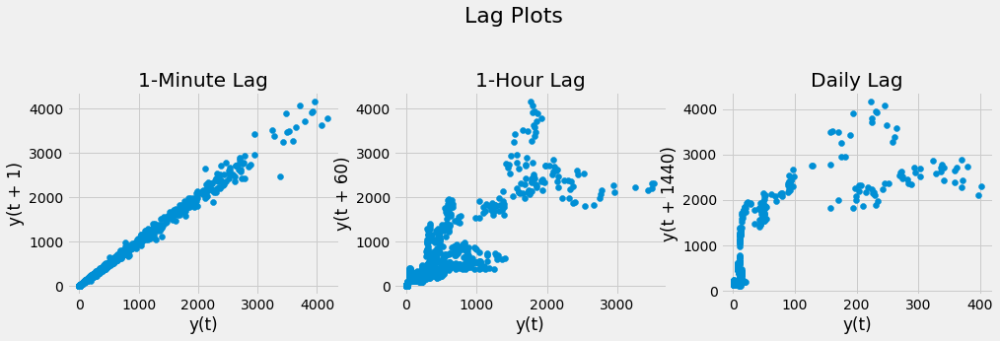

In [14]:
plt.figure(figsize=(15,12))
plt.suptitle('Lag Plots', fontsize=22)

plt.subplot(3,3,1)
pd.plotting.lag_plot(Timestamp['Close'], lag=1) #minute lag
plt.title('1-Minute Lag')

plt.subplot(3,3,2)
pd.plotting.lag_plot(Timestamp['Close'], lag=60) #hourley lag
plt.title('1-Hour Lag')

plt.subplot(3,3,3)
pd.plotting.lag_plot(Timestamp['Close'], lag=1440) #Daily lag
plt.title('Daily Lag')

plt.show()

# Decompose

In [15]:
from sklearn.metrics import mean_squared_error, mean_absolute_error
import pmdarima as pm
import statsmodels.api as sm

In [16]:
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.stattools import kpss
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

In [17]:
Timestamp_daily = Timestamp.resample("24H").mean()

<Figure size 432x288 with 0 Axes>

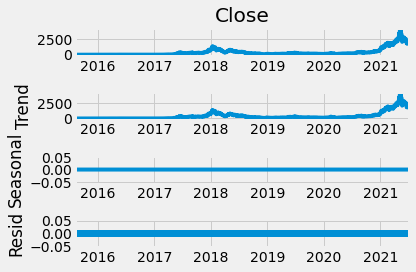

In [18]:
plt.figure()
series = Timestamp_daily.Close
result = seasonal_decompose(series, model='additive',period=1)
result.plot();

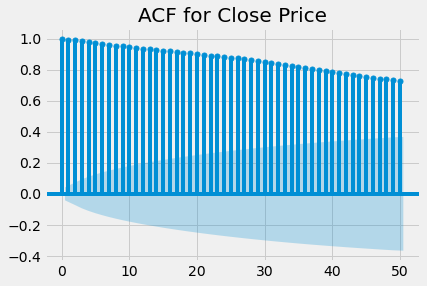

In [19]:
acf = plot_acf(series, lags=50, alpha=0.05)
plt.title("ACF for Close Price", size=20)
plt.show()

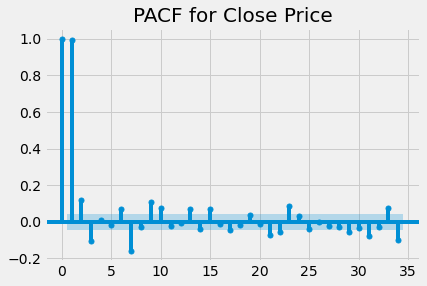

In [20]:
plot_pacf(series)
plt.title("PACF for Close Price", size=20)
plt.show()

# Adf test

In [23]:
def adf_test(timeseries):
    print ('Results of Dickey-Fuller Test:')
    dftest = adfuller(timeseries, autolag='AIC')
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
       dfoutput['Critical Value (%s)'%key] = value
    
    print (dfoutput)
    
    if p > 0.05:
        print('Series is not Stationary')
    else:
        print('Series is Stationary')

In [24]:
adf_test(series)

Results of Dickey-Fuller Test:
Test Statistic                   -0.026066
p-value                           0.956323
#Lags Used                       26.000000
Number of Observations Used    2133.000000
Critical Value (1%)              -3.433419
Critical Value (5%)              -2.862896
Critical Value (10%)             -2.567492
dtype: float64
Series is Stationary


# Rolling Window

In [25]:
df = Timestamp_daily

In [26]:
df.reset_index(drop=False, inplace=True)

lag_features = ["Open", "High", "Low", "Close", "Volume"]

window1 = 3
window2 = 7
window3 = 30

df_rolled_3d = df[lag_features].rolling(window=window1, min_periods=0)
df_rolled_7d = df[lag_features].rolling(window=window2, min_periods=0)
df_rolled_30d = df[lag_features].rolling(window=window3, min_periods=0)

df_mean_3d = df_rolled_3d.mean().shift(1).reset_index()
df_mean_7d = df_rolled_7d.mean().shift(1).reset_index()
df_mean_30d = df_rolled_30d.mean().shift(1).reset_index()

df_std_3d = df_rolled_3d.std().shift(1).reset_index()
df_std_7d = df_rolled_7d.std().shift(1).reset_index()
df_std_30d = df_rolled_30d.std().shift(1).reset_index()

for feature in lag_features:
    df[f"{feature}_mean_lag{window1}"] = df_mean_3d[feature]
    df[f"{feature}_mean_lag{window2}"] = df_mean_7d[feature]
    df[f"{feature}_mean_lag{window3}"] = df_mean_30d[feature]
    
    df[f"{feature}_std_lag{window1}"] = df_std_3d[feature]
    df[f"{feature}_std_lag{window2}"] = df_std_7d[feature]
    df[f"{feature}_std_lag{window3}"] = df_std_30d[feature]

df.fillna(df.mean(), inplace=True)

df.set_index("Date", drop=False, inplace=True)

In [27]:
df.head()

,Date,High,Low,Open,Close,Volume,Open_mean_lag3,Open_mean_lag7,Open_mean_lag30,Open_std_lag3,...,Close_mean_lag30,Close_std_lag3,Close_std_lag7,Close_std_lag30,Volume_mean_lag3,Volume_mean_lag7,Volume_mean_lag30,Volume_std_lag3,Volume_std_lag7,Volume_std_lag30
Date,,,,,,,,,,,,,,,,,,,,,
2015-08-08,2015-08-08,2.798810,0.714725,2.793760,0.753325,674188.0,380.979609,378.951018,367.560699,15.140070,...,368.549316,15.183008,23.038320,49.429607,7.041542e+09,7.019973e+09,6.885963e+09,1.027068e+09,1.310560e+09,1.802253e+09
2015-08-09,2015-08-09,0.879810,0.629191,0.706136,0.701897,532170.0,2.793760,2.793760,2.793760,15.140070,...,0.753325,15.183008,23.038320,49.429607,6.741880e+05,6.741880e+05,6.741880e+05,1.027068e+09,1.310560e+09,1.802253e+09
2015-08-10,2015-08-10,0.729854,0.636546,0.713989,0.708448,405283.0,1.749948,1.749948,1.749948,1.476173,...,0.727611,0.036365,0.036365,0.036365,6.031790e+05,6.031790e+05,6.031790e+05,1.004219e+05,1.004219e+05,1.004219e+05
2015-08-11,2015-08-11,1.131410,0.663235,0.708087,1.067860,1463100.0,1.404628,1.404628,1.404628,1.203030,...,0.721223,0.027993,0.027993,0.027993,5.372137e+05,5.372137e+05,5.372137e+05,1.345234e+05,1.345234e+05,1.345234e+05
2015-08-12,2015-08-12,1.289940,0.883608,1.058750,1.217440,2150620.0,0.709404,1.230493,1.230493,0.004089,...,0.807883,0.209423,0.174819,0.174819,8.001843e+05,7.686852e+05,7.686852e+05,5.775967e+05,4.757949e+05,4.757949e+05


In [28]:
df["month"] = df['Date'].dt.month
df["week"] = df['Date'].dt.week
df["day"] = df['Date'].dt.day
df["day_of_week"] = df['Date'].dt.dayofweek

In [29]:
df.replace(0, 0.01, inplace=True)

In [30]:
features = ['Open_mean_lag3', 'Open_mean_lag7', 'Open_mean_lag30', 'Open_std_lag3', 'Open_std_lag7',
       'Open_std_lag30', 'High_mean_lag3', 'High_mean_lag7', 'High_mean_lag30', 'High_std_lag3', 'High_std_lag7', 
        'High_std_lag30', 'Low_mean_lag3', 'Low_mean_lag7', 'Low_mean_lag30', 'Low_std_lag3', 'Low_std_lag7',
       'Low_std_lag30', 'Close_mean_lag3', 'Close_mean_lag7', 'Close_mean_lag30', 'Close_std_lag3', 'Close_std_lag7',
       'Close_std_lag30', 'Volume_mean_lag3', 'Volume_mean_lag7', 'Volume_mean_lag30', 'Volume_std_lag3', 'Volume_std_lag7', 
        'Volume_std_lag30', 'month', 'week', 'day', 'day_of_week']

# ARIMA Model

# Spliting data

In [31]:
df_train = df[df['Date'] < "2020"]
df_valid = df[df['Date'] >= "2021"]

print('train shape :', df_train.shape)
print('validation shape :', df_valid.shape)

train shape : (1607, 40)
validation shape : (187, 40)


In [32]:
model = pm.auto_arima(df_train.Close, exogenous=df_train[features], trace=True, error_action="ignore", suppress_warnings=True)

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=14533.073, Time=4.67 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=14540.104, Time=3.28 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=14550.655, Time=3.39 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=14552.961, Time=3.88 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=24795.281, Time=3.16 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=14546.347, Time=4.29 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=14598.555, Time=4.15 sec
 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=14535.043, Time=4.89 sec
 ARIMA(2,0,3)(0,0,0)[0] intercept   : AIC=14545.435, Time=4.91 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=14553.018, Time=3.97 sec
 ARIMA(1,0,3)(0,0,0)[0] intercept   : AIC=14538.909, Time=4.83 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=14545.366, Time=4.74 sec
 ARIMA(3,0,3)(0,0,0)[0] intercept   : AIC=14557.489, Time=6.03 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=14531.001, Time=4.35 sec
 ARIMA(1,0,2)(0,0,0

In [33]:
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                 1607
Model:               SARIMAX(2, 0, 2)   Log Likelihood               -7226.500
Date:                Sun, 20 Nov 2022   AIC                          14531.001
Time:                        11:43:18   BIC                          14740.904
Sample:                    08-08-2015   HQIC                         14608.928
                         - 12-31-2019                                         
Covariance Type:                  opg                                         
=====================================================================================
                        coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------
Open_mean_lag3       -1.6553      0.000  -1.13e+04      0.000      -1.656      -1.655
Open_mean_lag7       -1.1857      0.000  -8175.252      0.000      -1.186      -1.185
Open_mean_lag30       0.7360      0.000   5256.406      0.000       0.736       0.736
Open_std_lag3        -0.6608    5.9e-06  -1.12e+05      0.000      -0.661      -0.661
Open_std_lag7        -0.1408   9.79e-06  -1.44e+04      0.000      -0.141      -0.141
Open_std_lag30        0.9382   1.97e-05   4.75e+04      0.000       0.938       0.938
High_mean_lag3        0.8089      0.000   5271.948      0.000       0.809       0.809
High_mean_lag7       -0.5377      0.000  -3541.574      0.000      -0.538      -0.537
High_mean_lag30      -0.4910      0.000  -3347.871      0.000      -0.491      -0.491
High_std_lag3         0.5304   4.89e-06   1.08e+05      0.000       0.530       0.530
High_std_lag7         0.7801   9.31e-06   8.37e+04      0.000       0.780       0.780
High_std_lag30       -1.1657   2.05e-05  -5.68e+04      0.000      -1.166      -1.166
Low_mean_lag3         0.4447      0.000   3192.076      0.000       0.444       0.445
Low_mean_lag7        -0.9585      0.000  -6927.869      0.000      -0.959      -0.958
Low_mean_lag30       -0.6403      0.000  -4812.067      0.000      -0.641      -0.640
Low_std_lag3          0.3226   4.74e-06   6.81e+04      0.000       0.323       0.323
Low_std_lag7         -0.3020   9.66e-06  -3.13e+04      0.000      -0.302      -0.302
Low_std_lag30        -1.7405   1.99e-05  -8.76e+04      0.000      -1.741      -1.740
Close_mean_lag3       0.4855      0.000   3323.072      0.000       0.485       0.486
Close_mean_lag7       3.5297      0.000   2.43e+04      0.000       3.529       3.530
Close_mean_lag30      0.4352      0.000   3097.610      0.000       0.435       0.435
Close_std_lag3       -0.3027   5.89e-06  -5.14e+04      0.000      -0.303      -0.303
Close_std_lag7       -0.5469   9.78e-06  -5.59e+04      0.000      -0.547      -0.547
Close_std_lag30       1.9846   2.01e-05   9.89e+04      0.000       1.985       1.985
Volume_mean_lag3   2.448e-09   1.02e-09      2.394      0.017    4.43e-10    4.45e-09
Volume_mean_lag7  -2.343e-09   1.36e-09     -1.719      0.086   -5.01e-09    3.28e-10
Volume_mean_lag30 -2.186e-10   6.54e-10     -0.334      0.738    -1.5e-09    1.06e-09
Volume_std_lag3    3.083e-10   1.21e-09      0.255      0.798   -2.06e-09    2.67e-09
Volume_std_lag7   -2.147e-09   2.05e-09     -1.046      0.296   -6.17e-09    1.88e-09
Volume_std_lag30   2.203e-09   2.18e-09      1.009      0.313   -2.08e-09    6.49e-09
month                 0.1602   1.93e-07   8.29e+05      0.000       0.160       0.160
week                 -0.0222   6.87e-07  -3.23e+04      0.000      -0.022      -0.022
day                  -0.0015   2.55e-06   -604.922      0.000      -0.002      -0.002
day_of_week           0.0906   1.01e-07   8.97e+05      0.000       0.091       0.091
ar.L1                -0.3950   1.47e-05  -2.68e+04      0.0

In [34]:
model.fit(df_train.Close, exogenous=df_train[features])

ARIMA(order=(2, 0, 2), scoring_args={}, suppress_warnings=True,
      with_intercept=False)

In [35]:
forecast = model.predict(n_periods=len(df_valid), exogenous=df_valid[features])
df_valid["Forecast_ARIMAX"] = forecast

In [36]:
names = cycle(['Stock Close Price','Forecast ARIMAX'])

fig = px.line(df_valid, x=df_valid.index, y=[df_valid['Close'], df_valid['Forecast_ARIMAX']],
             labels={'Date': 'Date','value':'Stock Value'})

fig.update_layout(title_text='Stock analysis chart', font_size=15, font_color='black',legend_title_text='Stock Parameters')
fig.for_each_trace(lambda t:  t.update(name = next(names)))
fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)

fig.update_xaxes (rangeslider_visible=True)

fig.show()

In [37]:
print("RMSE of Auto ARIMAX:", np.sqrt(mean_squared_error(df_valid['Close'], df_valid['Forecast_ARIMAX'])))
print("MAE of Auto ARIMAX:", mean_absolute_error(df_valid['Close'], df_valid['Forecast_ARIMAX']))

RMSE of Auto ARIMAX: 156.11143889810333
MAE of Auto ARIMAX: 110.17189134755202


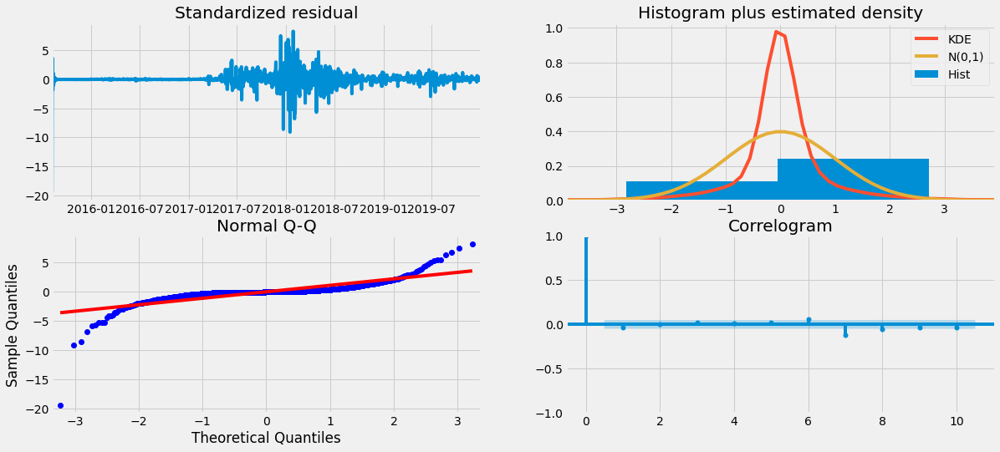

In [39]:
model.plot_diagnostics(figsize=(18, 8));

# Sarimax Model prediction

In [40]:
df_month = Timestamp.resample("24H").mean()
series = df_month['Close']
dec = sm.tsa.seasonal_decompose(df_month["Close"])

<Figure size 1080x864 with 0 Axes>

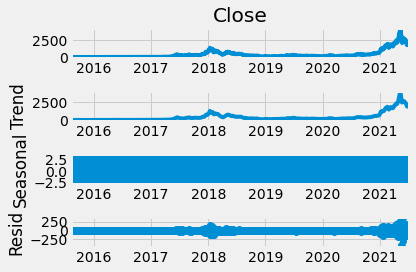

In [41]:
plt.figure(figsize=(15,12))
dec.plot();

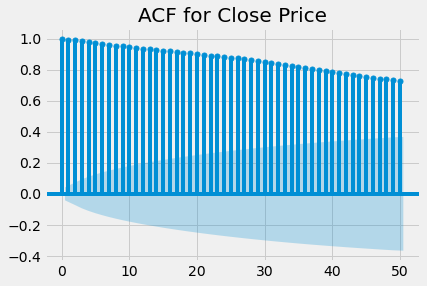

In [42]:
acf = plot_acf(series, lags=50, alpha=0.05)
plt.title("ACF for Close Price", size=20)
plt.show()

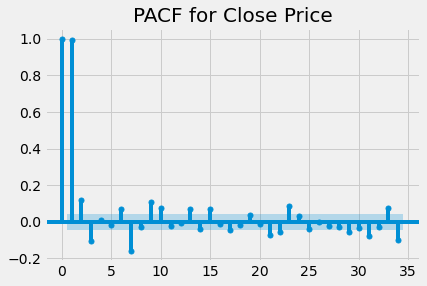

In [43]:
plot_pacf(series)
plt.title("PACF for Close Price", size=20)
plt.show()

# adf test

In [44]:
def adf_test(timeseries):
    print ('Results of Dickey-Fuller Test:')
    dftest = adfuller(timeseries, autolag='AIC')
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key] = value
    print (dfoutput)
    
    if p > 0.05:
        print('Series is not Stationary')
    else:
        print('Series is Stationary')

In [45]:
adf_test(series)

Results of Dickey-Fuller Test:
Test Statistic                   -0.026066
p-value                           0.956323
#Lags Used                       26.000000
Number of Observations Used    2133.000000
Critical Value (1%)              -3.433419
Critical Value (5%)              -2.862896
Critical Value (10%)             -2.567492
dtype: float64
Series is Stationary


# Spliting data

In [46]:
df_train = series[:"2020"]
df_valid = series["2020":]

print('train shape :', df_train.shape)
print('validation shape :', df_valid.shape)

train shape : (1973,)
validation shape : (553,)


In [47]:
###SARIMAX###

#Constructs all possible parameter combinations.
p = d = q = range(0,2)
pdq = list(itertools.product(p,d,q))

seasonal_pdq = [(x[0],x[1],x[2],12) for x in list(itertools.product(p,d,q))]

In [48]:
def sarimax_function(data,pdq,s_pdq):

    """
    The function uses a brute force approach to apply all possible pdq combinations and evaluate the model
    """

    result_list = []
    for param in pdq:
        for s_param in s_pdq:

            model = sm.tsa.statespace.SARIMAX(data, order=param, seasonal_order=s_param,
            enforce_invertibility=False,enforce_stationarity=False)

            results = model.fit()
            result_list.append([param,s_param,results.aic])
            print("ARIMA Parameters: {} x: {}. AIC: {}".format(param,s_param,results.aic))

    return result_list,results

In [49]:
result_list,results = sarimax_function(df_train,pdq,seasonal_pdq)

ARIMA Parameters: (0, 0, 0) x: (0, 0, 0, 12). AIC: 28371.367466698764
ARIMA Parameters: (0, 0, 0) x: (0, 0, 1, 12). AIC: 26093.25263445054
ARIMA Parameters: (0, 0, 0) x: (0, 1, 0, 12). AIC: 22200.114417578217
ARIMA Parameters: (0, 0, 0) x: (0, 1, 1, 12). AIC: 22062.72677203383
ARIMA Parameters: (0, 0, 0) x: (1, 0, 0, 12). AIC: 22207.915102184055
ARIMA Parameters: (0, 0, 0) x: (1, 0, 1, 12). AIC: 22181.9017786917
ARIMA Parameters: (0, 0, 0) x: (1, 1, 0, 12). AIC: 22071.187519832158
ARIMA Parameters: (0, 0, 0) x: (1, 1, 1, 12). AIC: 22061.551237312753
ARIMA Parameters: (0, 0, 1) x: (0, 0, 0, 12). AIC: 25767.789919954674
ARIMA Parameters: (0, 0, 1) x: (0, 0, 1, 12). AIC: 23692.268335916913
ARIMA Parameters: (0, 0, 1) x: (0, 1, 0, 12). AIC: 20436.85337779358
ARIMA Parameters: (0, 0, 1) x: (0, 1, 1, 12). AIC: 20319.453718702447
ARIMA Parameters: (0, 0, 1) x: (1, 0, 0, 12). AIC: 20448.32552305129
ARIMA Parameters: (0, 0, 1) x: (1, 0, 1, 12). AIC: 20427.70466147439
ARIMA Parameters: (0, 0, 1)

In [50]:
#Dataframe of all results and parameters.

results_dataframe = pd.DataFrame(result_list, columns=["dpq","s_dpq","aic"]).sort_values(by="aic")
results_dataframe.head()

,dpq,s_dpq,aic
27,"(0, 1, 1)","(0, 1, 1, 12)",17091.078325
63,"(1, 1, 1)","(1, 1, 1, 12)",17091.195349
31,"(0, 1, 1)","(1, 1, 1, 12)",17091.908581
59,"(1, 1, 1)","(0, 1, 1, 12)",17092.930054
51,"(1, 1, 0)","(0, 1, 1, 12)",17099.015110


In [51]:
model = sm.tsa.statespace.SARIMAX(df_train, order=(0, 1, 1), seasonal_order=(0, 1, 1, 12),
            enforce_invertibility=False,enforce_stationarity=False).fit()
print(model.summary().tables[1])

                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1          0.0342      0.008      4.276      0.000       0.019       0.050
ma.S.L12      -1.0000     16.565     -0.060      0.952     -33.466      31.466
sigma2       370.4545   6137.093      0.060      0.952   -1.17e+04    1.24e+04


In [52]:
prediction = model.predict(start=pd.to_datetime("2020-01-01"),end=pd.to_datetime("2021-07-06"))

In [53]:
dataset = pd.DataFrame(np.vstack((df_valid.values, prediction.values)).T, index=df_valid.index, 
                          columns=['Actual', 'Predicted'])

In [54]:
names = cycle(['Stock Close Price','Forecast SARIMAX'])

fig = px.line(dataset, x=dataset.index, y=[dataset['Actual'], dataset['Predicted']],
             labels={'Date': 'Date','value':'Stock Value'})

fig.update_layout(title_text='Stock analysis chart', font_size=15, font_color='black',legend_title_text='Stock Parameters')
fig.for_each_trace(lambda t:  t.update(name = next(names)))
fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)

fig.update_xaxes (rangeslider_visible=True)

fig.show()

In [55]:
Forecast_SARIMAX = model.predict(start=pd.to_datetime("2015-08-08"), end=pd.to_datetime("2020-12-31"))

In [56]:
dataset = pd.DataFrame(np.vstack((df_train.values, Forecast_SARIMAX.values)).T, index=df_train.index, 
                          columns=['Actual', 'Predicted'])

In [57]:
names = cycle(['Stock Close Price','Forecast SARIMAX'])

fig = px.line(dataset, x=dataset.index, y=[dataset['Actual'], dataset['Predicted']],
             labels={'Date': 'Date','value':'Stock Value'})

fig.update_layout(title_text='Stock analysis chart', font_size=15, font_color='black',legend_title_text='Stock Parameters')
fig.for_each_trace(lambda t:  t.update(name = next(names)))
fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)

fig.update_xaxes (rangeslider_visible=True)

fig.show()

In [58]:
print("RMSE of Auto SARIMAX:", np.sqrt(mean_squared_error(df_valid, prediction)))
print("MAE of Auto SARIMAX:", mean_absolute_error(df_valid, prediction))

RMSE of Auto SARIMAX: 853.1032201634772
MAE of Auto SARIMAX: 448.1506194078341


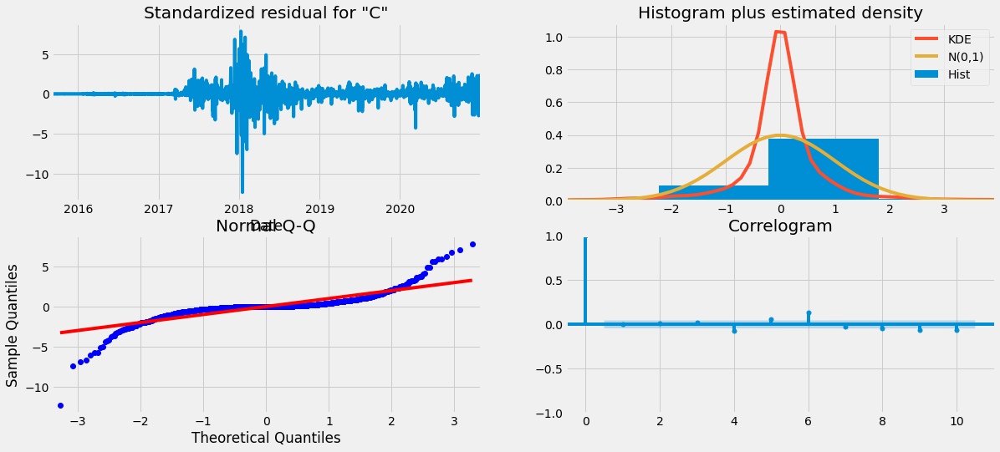

In [59]:
model.plot_diagnostics(figsize=(18, 8));

# prophet model

In [103]:
from prophet import Prophet

In [105]:
weekly_data = Timestamp.resample("24H").mean() 

In [106]:
# Renaming the column names accroding to Prophet's requirements

weekly_data_fb = weekly_data.reset_index()[['Date','Close']].rename({'Date':'ds','Close':'y'}, axis=1)
weekly_data_fb.head()

,ds,y
0,2015-08-09,0.727611
1,2015-08-16,1.414888
2,2015-08-23,1.305936
3,2015-08-30,1.196049
4,2015-09-06,1.311231


In [107]:
split_date = "2021-01-01"
train_split = weekly_data_fb['ds'] <= split_date
test_split = weekly_data_fb['ds'] > split_date

train_fb = weekly_data_fb[train_split]
test_fb = weekly_data_fb[test_split]

In [108]:
print("train data shape :", train_fb.shape)
print("test data shape :", test_fb.shape)

train data shape : (282, 2)
test data shape : (28, 2)


In [109]:
model_fbp = Prophet()
for feature in features:
    model_fbp.add_regressor(feature)

In [110]:
model_fbp.fit(df_train[["Date", "Close"] + features].rename(columns={"Date": "ds", "Close": "y"}))

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpjm1k5sty/dvv3as35.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpjm1k5sty/66m1jf97.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.7/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=28240', 'data', 'file=/tmp/tmpjm1k5sty/dvv3as35.json', 'init=/tmp/tmpjm1k5sty/66m1jf97.json', 'output', 'file=/tmp/tmpjm1k5sty/prophet_modelatbho0v_/prophet_model-20221031084940.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
08:49:40 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
08:49:43 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


In [111]:
forecast = model_fbp.predict(df_valid[["Date", "Close"] + features].rename(columns={"Date": "ds"}))
forecast.head()

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,Close_mean_lag3,Close_mean_lag3_lower,Close_mean_lag3_upper,Close_mean_lag30,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2021-01-01,283.967701,680.531939,735.194092,283.967701,283.967701,189.593722,189.593722,189.593722,688.919436,...,-0.555319,-0.555319,-0.555319,-0.528598,-0.528598,-0.528598,0.0,0.0,0.0,707.973502
1,2021-01-02,284.075543,675.758406,728.629957,284.075543,284.075543,189.457820,189.457820,189.457820,696.130118,...,0.315607,0.315607,0.315607,-1.086779,-1.086779,-1.086779,0.0,0.0,0.0,702.885171
2,2021-01-03,284.183385,719.595968,773.506626,284.183385,284.183385,192.159945,192.159945,192.159945,704.750597,...,0.589216,0.589216,0.589216,-1.682386,-1.682386,-1.682386,0.0,0.0,0.0,747.342454
3,2021-01-04,284.291227,996.261920,1047.392596,284.291227,284.291227,220.188687,220.188687,220.188687,726.934730,...,0.563445,0.563445,0.563445,-2.316270,-2.316270,-2.316270,0.0,0.0,0.0,1021.249630
4,2021-01-05,284.399069,1110.201703,1162.457426,284.399069,284.399069,256.726271,256.726271,256.726271,751.166247,...,0.433257,0.433257,0.433257,-2.988759,-2.988759,-2.988759,0.0,0.0,0.0,1136.620915


In [112]:
df_valid["Forecast_Prophet"] = forecast['yhat'].values

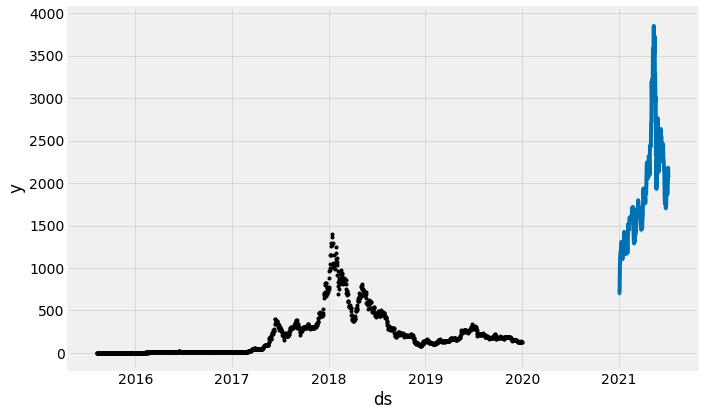

In [113]:
# Plot Our Predictions
fig1 = model_fbp.plot(forecast)

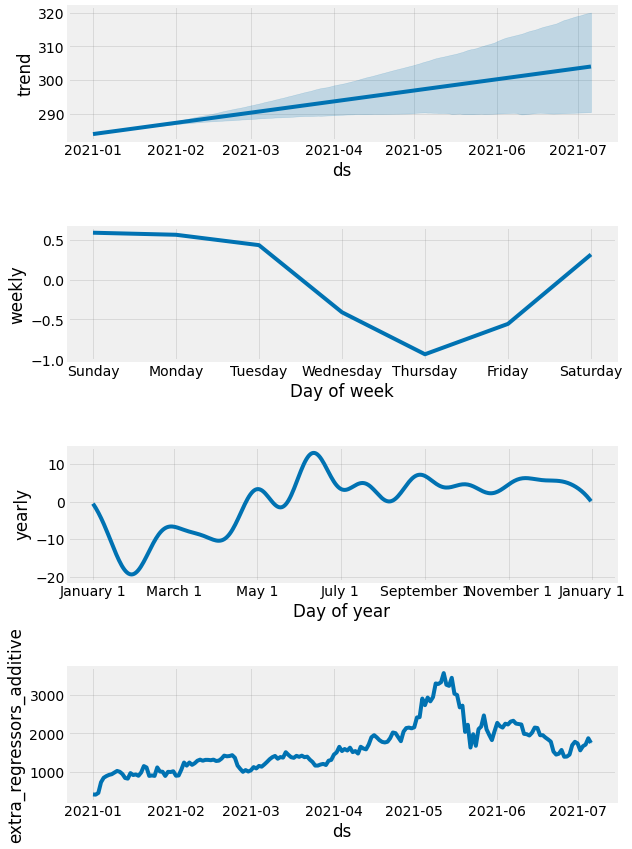

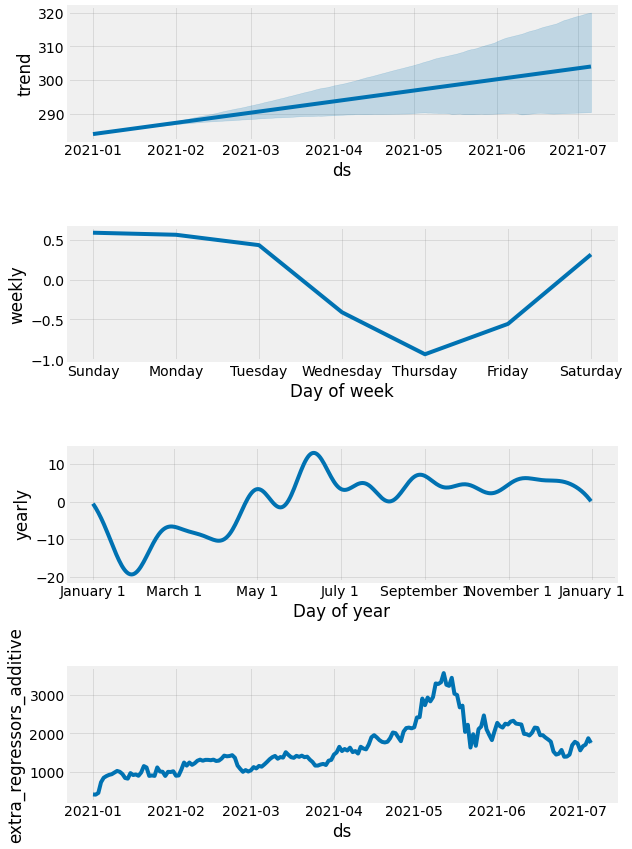

In [114]:
model_fbp.plot_components(forecast)

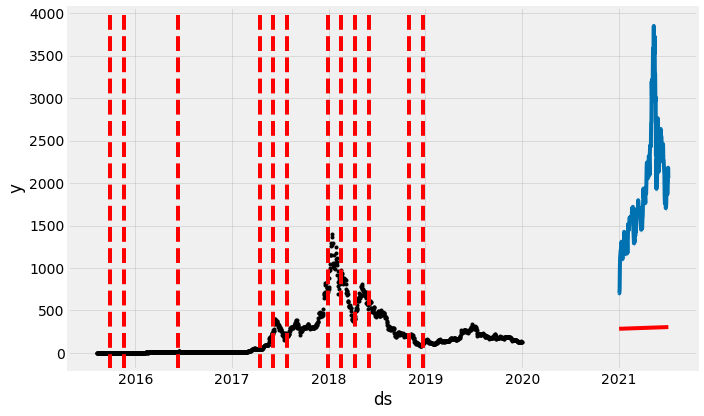

In [115]:
# Plotting changepoints
from prophet.plot import add_changepoints_to_plot
fig = model_fbp.plot(forecast)
a = add_changepoints_to_plot(fig.gca(), model_fbp, forecast)

In [ ]:
names = cycle(['Stock Close Price','Forecast Prophet'])

fig = px.line(df_valid, x=df_valid.index, y=[df_valid['Close'], df_valid['Forecast_Prophet']],
             labels={'Date': 'Date','value':'Stock Value'})

fig.update_layout(title_text='Stock analysis chart', font_size=15, font_color='black',legend_title_text='Stock Parameters')
fig.for_each_trace(lambda t:  t.update(name = next(names)))
fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)

fig.update_xaxes (rangeslider_visible=True)

fig.show()

In [117]:
test_mae = mean_absolute_error(df_valid['Close'], df_valid['Forecast_Prophet'])
test_rmse = np.sqrt(mean_squared_error(df_valid['Close'], df_valid['Forecast_Prophet']))

print(f" Prophet's MAE : {test_mae}")
print(f"Prophet's RMSE : {test_rmse}")

 Prophet's MAE : 189.3567783801929
Prophet's RMSE : 234.87677709262616


# XGBoost model

In [60]:
from sklearn import ensemble
from sklearn import metrics
from sklearn.model_selection import RandomizedSearchCV
import xgboost as xgb
from xgboost import plot_importance, plot_tree
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
plt.style.use('fivethirtyeight')

from datetime import datetime

In [61]:
df_train = df[df['Date'] < "2020"]
df_valid = df[df['Date'] >= "2021"]

print('train shape :', df_train.shape)
print('validation shape :', df_valid.shape)

train shape : (1607, 40)
validation shape : (187, 40)


In [62]:
X_train, y_train = df_train[features], df_train['Close']
X_test, y_test = df_valid[features], df_valid['Close']

In [63]:
model = xgb.XGBRegressor()

In [64]:
model.fit(X_train, y_train)

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.300000012, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=100, n_jobs=0, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None)

In [65]:
df_train['Predicted_Price'] = model.predict(X_train)

In [66]:
names = cycle(['Stock Close Price','Forecast Prophet'])

fig = px.line(df_train, x=df_train.index, y=[df_train['Close'], df_train['Predicted_Price']],
             labels={'Date': 'Date','value':'Stock Value'})

fig.update_layout(title_text='Stock analysis chart', font_size=15, font_color='black',legend_title_text='Stock Parameters')
fig.for_each_trace(lambda t:  t.update(name = next(names)))
fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)

fig.update_xaxes (rangeslider_visible=True)

fig.show()

In [67]:
df_valid['Forecast_XGBoost'] = model.predict(X_test)
overall_data = pd.concat([df_train, df_valid], sort=False)

In [68]:
names = cycle(['Stock Close Price','Forecast Prophet'])

fig = px.line(overall_data, x=overall_data.index, y=[overall_data['Close'], overall_data['Forecast_XGBoost']],
             labels={'Date': 'Date','value':'Stock Value'})

fig.update_layout(title_text='Stock analysis chart', font_size=15, font_color='black',legend_title_text='Stock Parameters')
fig.for_each_trace(lambda t:  t.update(name = next(names)))
fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)

fig.update_xaxes (rangeslider_visible=True)

fig.show()

In [69]:
names = cycle(['Stock Close Price','Forecast XGBoost'])

fig = px.line(df_valid, x=df_valid.index, y=[df_valid['Close'], df_valid['Forecast_XGBoost']],
             labels={'Date': 'Date','value':'Stock Value'})

fig.update_layout(title_text='Stock analysis chart', font_size=15, font_color='black',legend_title_text='Stock Parameters')
fig.for_each_trace(lambda t:  t.update(name = next(names)))
fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)

fig.update_xaxes (rangeslider_visible=True)

fig.show()

In [70]:
train_mae = mean_absolute_error(df_train['Close'], df_train['Predicted_Price'])
train_rmse = np.sqrt(mean_squared_error(df_train['Close'], df_train['Predicted_Price']))
train_r2 = r2_score(df_train['Close'], df_train['Predicted_Price'])

print(f"train MAE : {train_mae}")
print(f"train RMSE : {train_rmse}")
print(f"train R2 : {train_r2}")

train MAE : 0.3963652975572537
train RMSE : 0.5777598491987427
train R2 : 0.9999943546294494


In [71]:
test_mae = mean_absolute_error(df_valid['Close'], df_valid['Forecast_XGBoost'])
test_rmse = np.sqrt(mean_squared_error(df_valid['Close'], df_valid['Forecast_XGBoost']))
test_r2 = r2_score(df_valid['Close'], df_valid['Forecast_XGBoost'])

print(f"test MAE : {test_mae}")
print(f"test RMSE : {test_rmse}")
print(f"test R2 : {test_r2}")

test MAE : 1015.4418745677483
test RMSE : 1227.0006435377804
test R2 : -2.223618469246014


# LSTM Model

In [72]:
price_series = Timestamp.reset_index()['Close'].values
price_series

array([7.53324986e-01, 7.01897025e-01, 7.08447993e-01, ...,
       2.32172411e+03, 2.19858246e+03, 2.32467945e+03])

In [73]:
price_series.shape

(2160,)

In [74]:
# Feature Scaling
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler(feature_range = (0, 1))
price_series_scaled = scaler.fit_transform(price_series.reshape(-1,1))

In [75]:
price_series_scaled

array([[7.64097042e-05],
       [6.40717302e-05],
       [6.56433591e-05],
       ...,
       [5.56895640e-01],
       [5.27352985e-01],
       [5.57604648e-01]])

In [76]:
price_series_scaled.shape

(2160, 1)

In [77]:
train_data, test_data = price_series_scaled[0:1900], price_series_scaled[1900:]

In [78]:
train_data.shape, test_data.shape

((1900, 1), (260, 1))

In [79]:
def windowed_dataset(series, time_step):
    dataX, dataY = [], []
    for i in range(len(series)- time_step-1):
        a = series[i : (i+time_step), 0]
        dataX.append(a)
        dataY.append(series[i+ time_step, 0])
        
    return np.array(dataX), np.array(dataY)

In [80]:
X_train, y_train = windowed_dataset(train_data, time_step=100)
X_test, y_test = windowed_dataset(test_data, time_step=100)

In [81]:
X_train.shape, y_train.shape, X_test.shape, y_test.shape

((1799, 100), (1799,), (159, 100), (159,))

In [82]:
#reshape inputs to be [samples, timesteps, features] which is requred for LSTM

X_train = X_train.reshape(X_train.shape[0], X_train.shape[1], 1)
X_test = X_test.reshape(X_test.shape[0], X_test.shape[1], 1)


print(X_train.shape) 
print(X_test.shape)

(1799, 100, 1)
(159, 100, 1)


In [83]:
print(y_train.shape) 
print(y_test.shape)

(1799,)
(159,)


In [84]:
#Create Stacked LSTM Model

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import LSTM
from tensorflow.keras.layers import Dropout

In [85]:
from tensorflow.keras import layers, models

In [86]:
model = models.Sequential()

model.add(LSTM(units = 100, activation = 'relu', return_sequences = True, input_shape = (X_train.shape[1], 1)))
model.add(Dropout(0.3))

model.add(LSTM(units = 50, activation = 'relu', return_sequences = True))
model.add(Dropout(0.4))

model.add(LSTM(units = 10, activation = 'relu'))
model.add(Dropout(0.2))

model.add(Dense(units = 1))

# Compiling the RNN
model.compile(optimizer = 'adamax', loss = 'mse', metrics = 'mae')

In [87]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm (LSTM)                  (None, 100, 100)          40800     
_________________________________________________________________
dropout (Dropout)            (None, 100, 100)          0         
_________________________________________________________________
lstm_1 (LSTM)                (None, 100, 50)           30200     
_________________________________________________________________
dropout_1 (Dropout)          (None, 100, 50)           0         
_________________________________________________________________
lstm_2 (LSTM)                (None, 10)                2440      
_________________________________________________________________
dropout_2 (Dropout)          (None, 10)                0         
_________________________________________________________________
dense (Dense)                (None, 1)                 1

In [88]:
# Fitting the RNN to the Training set
history = model.fit(X_train, y_train, validation_split=0.1, epochs = 30, batch_size = 32, verbose=1, shuffle=False)

Epoch 1/30
51/51 [==============================] - 13s 169ms/step - loss: 0.0049 - mae: 0.0411 - val_loss: 0.0021 - val_mae: 0.0414
Epoch 2/30
51/51 [==============================] - 8s 155ms/step - loss: 0.0037 - mae: 0.0389 - val_loss: 0.0010 - val_mae: 0.0265
Epoch 3/30
51/51 [==============================] - 8s 156ms/step - loss: 0.0034 - mae: 0.0400 - val_loss: 7.0813e-04 - val_mae: 0.0205
Epoch 4/30
51/51 [==============================] - 8s 156ms/step - loss: 0.0032 - mae: 0.0395 - val_loss: 5.3937e-04 - val_mae: 0.0174
Epoch 5/30
51/51 [==============================] - 9s 170ms/step - loss: 0.0029 - mae: 0.0380 - val_loss: 3.3731e-04 - val_mae: 0.0134
Epoch 6/30
51/51 [==============================] - 8s 159ms/step - loss: 0.0021 - mae: 0.0327 - val_loss: 2.7834e-04 - val_mae: 0.0130
Epoch 7/30
51/51 [==============================] - 8s 156ms/step - loss: 0.0015 - mae: 0.0277 - val_loss: 4.9362e-04 - val_mae: 0.0201
Epoch 8/30
51/51 [==============================] - 8s 

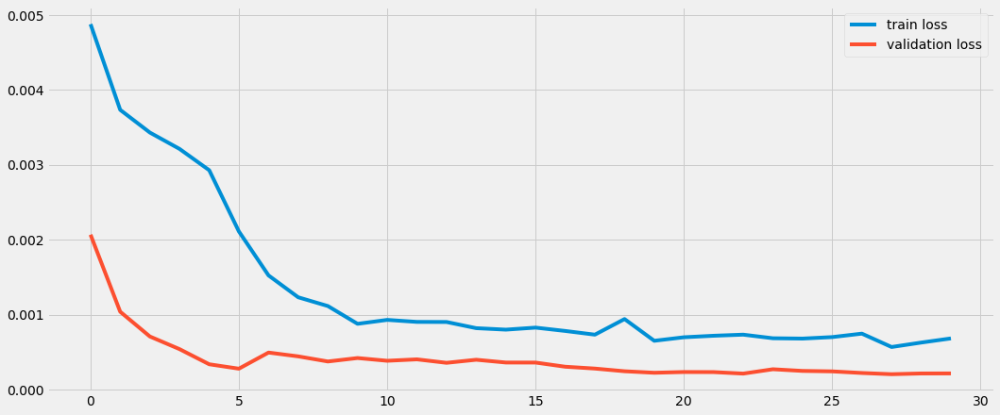

In [89]:
plt.figure(figsize=(16,7))
plt.plot(history.history["loss"], label= "train loss")
plt.plot(history.history["val_loss"], label= "validation loss")
plt.legend();

In [90]:
#Lets do the prediction and performance checking

train_predict = model.predict(X_train)
test_predict = model.predict(X_test)

In [91]:
#transformation to original form

y_train_inv = scaler.inverse_transform(y_train.reshape(-1, 1))
y_test_inv = scaler.inverse_transform(y_test.reshape(-1, 1))
train_predict_inv = scaler.inverse_transform(train_predict)
test_predict_inv = scaler.inverse_transform(test_predict)

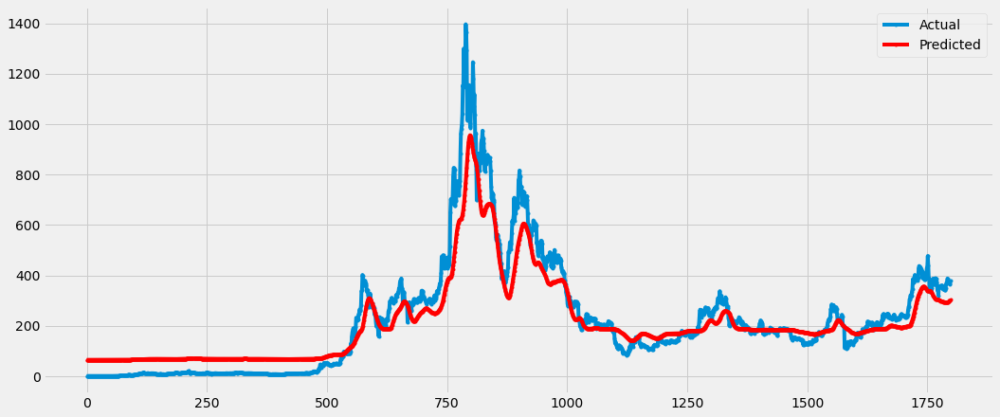

In [92]:
plt.figure(figsize=(16,7))
plt.plot(y_train_inv.flatten(), marker='.', label="Actual")
plt.plot(train_predict_inv.flatten(), 'r', marker='.', label="Predicted")
plt.legend();

In [93]:
from sklearn.metrics import mean_absolute_error, mean_squared_error

train_RMSE = np.sqrt(mean_squared_error(y_train, train_predict))
test_RMSE = np.sqrt(mean_squared_error(y_test, test_predict))
train_MAE = np.sqrt(mean_absolute_error(y_train, train_predict))
test_MAE = np.sqrt(mean_absolute_error(y_test, test_predict))


print(f"Train RMSE: {train_RMSE}")
print(f"Train MAE: {train_MAE}")

print(f"Test RMSE: {test_RMSE}")
print(f"Test MAE: {test_MAE}")

Train RMSE: 0.020061204304369442
Train MAE: 0.11780750199080077
Test RMSE: 4.369111754481883
Test MAE: 1.6300058321006778
